<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/ResNet101V22exp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/MyDrive/dataset brain tumor/dataset


In [3]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

Archive:  axial_t1wce_2_class.zip
  inflating: /dataset unzipped/axial_t1wce_2_class/axial_t1wce_2_class.yaml  
   creating: /dataset unzipped/axial_t1wce_2_class/images/
   creating: /dataset unzipped/axial_t1wce_2_class/images/test/
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_101.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_109.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_111.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_117.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_121.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_126.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_134.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_66.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_75.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/image

In [4]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

Archive:  coronal_t1wce_2_class.zip
  inflating: /dataset unzipped/coronal_t1wce_2_class/coronal_t1wce_2_class.yaml  
   creating: /dataset unzipped/coronal_t1wce_2_class/images/
   creating: /dataset unzipped/coronal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/13.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/15.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/17.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/19.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/20.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/23.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/33.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/34.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/35.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/36.jpg  
  inflating: /d

In [5]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

Archive:  sagittal_t1wce_2_class.zip
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_102.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_121.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_140.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_159.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_110.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_129.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_147.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_166.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_154.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_173.jpg  
  inflating: /

In [6]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import imutils

In [7]:
%cd '/dataset unzipped'

/dataset unzipped


In [8]:
def crop_brain_contour(image, plot=False):
    
    #import imutils
    #import cv2
    #from matplotlib import pyplot as plt
    
    # Convert the image to grayscale, and blur it slightl
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    #thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)[1]
    #thresh = cv2.erode(thresh, None, iterations=2)
    #thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image,extLeft,extRight,extTop,extBot

In [9]:
#Bounding box with one tumor
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
X_train = []
bb = []
count = 0;
temp_array  = []
extLeft_coords_x = []
extLeft_coords_y = []
extRight_coords_x = []
extRight_coords_y = []
extTop_coords_x = []
extTop_coords_y = []
extBot_coords_x = []
extBot_coords_y = []
image_width = []
image_height = []


extLeft_coords_x_test = []
extLeft_coords_y_test = []
extRight_coords_x_test = []
extRight_coords_y_test = []
extTop_coords_x_test = []
extTop_coords_y_test = []
extBot_coords_x_test = []
extBot_coords_y_test = []
images_width_test = []
images_height_test = []
width_new_im = []
height_new_im = []
traslazione_x_test = []
traslazione_y_test = []

image_size = 224

for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        image_width.append(img.shape[1])
        image_height.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image,extLeft,extRight,extTop,extBot = crop_brain_contour(img,False)
        extLeft_coords_x.append(extLeft[0])
        extLeft_coords_y.append(extLeft[1])
        extRight_coords_x.append(extRight[0])
        extRight_coords_y.append(extRight[1])
        extTop_coords_x.append(extTop[0])
        extTop_coords_y.append(extTop[1])
        extBot_coords_x.append(extBot[0])
        extBot_coords_y.append(extBot[1])
        # resize image
        image = cv2.resize(image, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_train.append(image)

image_index = 0
#bb_train = np.zeros((len(X_train),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                 
                temp_array[0] = temp_array[0]*image_width[count] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x[count]
                temp_array[0] = (temp_array[0]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                temp_array[1] = temp_array[1]*image_height[count]
                temp_array[1] = temp_array[1]-extTop_coords_y[count]
                temp_array[1] = (temp_array[1]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size
                
                temp_array[2] = temp_array[2]*(image_width[count])
                temp_array[2] = (temp_array[2]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                
                temp_array[3] = temp_array[3]*(image_height[count])
                temp_array[3] = (temp_array[3]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size                 
            
                lbls_array.append(temp_array)

                #print(temp_array)
                #bb_train[image_index] = np.array([temp_array])
                #print(bb_train[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_train: ', len(X_train))
print('bb_list: ', len(bb_list))

for i in range(len(X_train)):
  if(len(duplicate_img[i]) == 2):
    X_train.append(X_train[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata
bb_train = np.zeros((len(X_train),4))

for j in range(len(bb_list)):
  bb_train[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_train: ', len(X_train))
print('bb_train: ', len(bb_train))

X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        images_width_test.append(img.shape[1])
        images_height_test.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image_test,extLeft_test,extRight_test,extTop_test,extBot_test = crop_brain_contour(img,False)
        extLeft_coords_x_test.append(extLeft_test[0])
        extLeft_coords_y_test.append(extLeft_test[1])
        extRight_coords_x_test.append(extRight_test[0])
        extRight_coords_y_test.append(extRight_test[1])
        extTop_coords_x_test.append(extTop_test[0])
        extTop_coords_y_test.append(extTop_test[1])
        extBot_coords_x_test.append(extBot_test[0])
        extBot_coords_y_test.append(extBot_test[1])
        # resize image
        image_test = cv2.resize(image_test, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_test.append(image_test)

image_index = 0
count_test = 0;
#bb_test = np.zeros((len(X_test),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                #width_new_im.append(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test])
                #height_new_im.append(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test])
                
                
                temp_array[0] = temp_array[0]*images_width_test[count_test] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x_test[count_test]
                temp_array[0] = (temp_array[0]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                temp_array[1] = temp_array[1]*images_height_test[count_test]
                temp_array[1] = temp_array[1]-extTop_coords_y_test[count_test]
                temp_array[1] = (temp_array[1]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size
                
                temp_array[2] = temp_array[2]*(images_width_test[count_test])
                temp_array[2] = (temp_array[2]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                
                temp_array[3] = temp_array[3]*(images_height_test[count_test])
                temp_array[3] = (temp_array[3]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size                 
            
                lbls_array.append(temp_array)

                #bb_test[image_index] = np.array([temp_array])
                #print(bb_test[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count_test += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_test: ', len(X_test))
print('bb_list: ', len(bb_list))

for i in range(len(X_test)):
  if(len(duplicate_img[i]) == 2):
    X_test.append(X_test[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata

bb_test = np.zeros((len(X_test),4))

for j in range(len(bb_test)):
  bb_test[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_test: ', len(X_test))
print('bb_test: ', len(bb_test))

#print(bb_test[30])
#print(extRight_coords_x_test[30])
#print(extLeft_coords_x_test[30])

Dimensione delle liste prima di duplicare le immagini:
X_train:  878
bb_list:  878
Dimensione delle liste dopo la duplicazione delle immagini:
X_train:  919
bb_train:  919
Dimensione delle liste prima di duplicare le immagini:
X_test:  223
bb_list:  223
Dimensione delle liste dopo la duplicazione delle immagini:
X_test:  237
bb_test:  237


In [10]:
len(X_train)

919

In [11]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [12]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [13]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [14]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [15]:
BATCH_SIZE = 16
#save_path = os.path.join('./', 'model_effnet')
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [16]:
METRIC_THRESH = 0.3

def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):


        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2
    
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2
    
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)


        # This must match the type used in py_func
        results.append(iou)
    return np.mean(results)

def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou



In [17]:
#def iou(y_true,y_pred):
  #pred_bbox_val = model.predict(X_val)
  #iou = tf.numpy_function(calculate_iou,[y_true,y_pred],tf.float32)
  #return iou

In [18]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in rosso
        xmin, ymin, width, height = bbox_coords
        img = cv2.rectangle(img, (int(xmin-width/2), int(ymin-height/2)), (int(xmin+width/2), int(ymin+height/2)), (255, 0, 0), 1)
        #img = cv2.rectangle(img, (0,0),(10,10), (0, 0, 255), 1)
    if len(pred_coords) == 4: #in verde
        xmin1, ymin1, width1, height1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-width1/2), int(ymin1-height1/2)), (int(xmin1+width1/2), int(ymin1+height1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [19]:
#To test the model
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]
    #example, label = next(datagen)
    #X = example['image']
    #y = label['coords']
    #pred_bbox = model.predict(X)[0]
    #img = X[0]
    #gt_coords = y[0]
    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [20]:
%cd '../content/drive/MyDrive'
! mkdir  model_checkpoint_RESNET

/content/drive/MyDrive
mkdir: cannot create directory ‘model_checkpoint_RESNET’: File exists


In [21]:
save_path = './model_checkpoint_RESNET/model_RESNET.h5'

In [22]:
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor="val_IoU",
    verbose=1,
    mode='max',
    save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=50,
),

    ShowTestImages()
]

In [26]:
resnet = ResNet101V2(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))
model = resnet.output
model = tf.keras.layers.AveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=resnet.inputs, outputs = model)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [28]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 26.6535 - IoU: 0.1495
Epoch 1: val_IoU improved from -inf to 0.00000, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 141ms/step


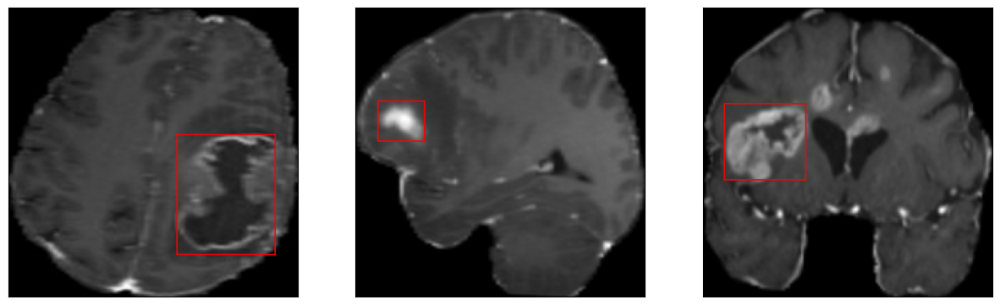

52/52 [==============================] - 111s 868ms/step - loss: 26.6535 - IoU: 0.1495 - val_loss: 118418.6953 - val_IoU: 0.0000e+00
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 15.2769 - IoU: 0.3073
Epoch 2: val_IoU improved from 0.00000 to 0.00914, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 142ms/step


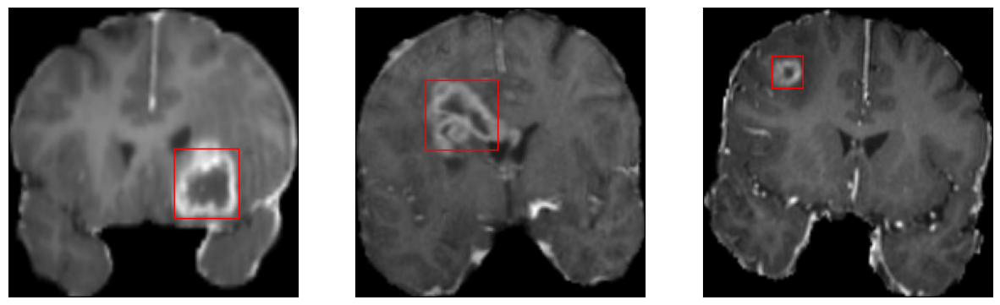

52/52 [==============================] - 36s 693ms/step - loss: 15.2769 - IoU: 0.3073 - val_loss: 877.7699 - val_IoU: 0.0091
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 12.7126 - IoU: 0.3841
Epoch 3: val_IoU improved from 0.00914 to 0.10000, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


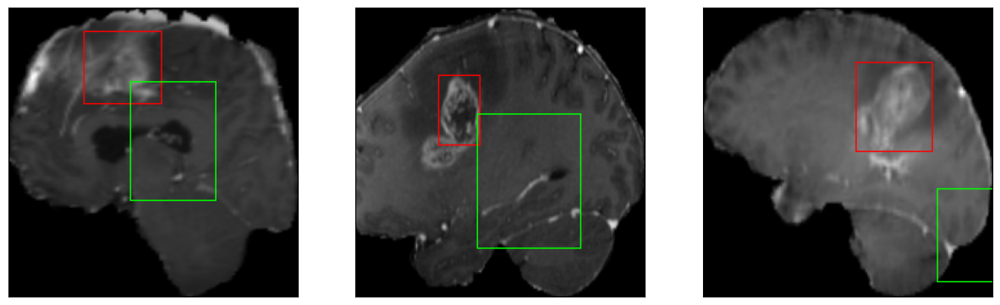

52/52 [==============================] - 36s 707ms/step - loss: 12.7126 - IoU: 0.3841 - val_loss: 36.4384 - val_IoU: 0.1000
Epoch 4/100
52/52 [==============================] - ETA: 0s - loss: 12.3477 - IoU: 0.3854
Epoch 4: val_IoU did not improve from 0.10000
8/8 [==============================] - 1s 147ms/step


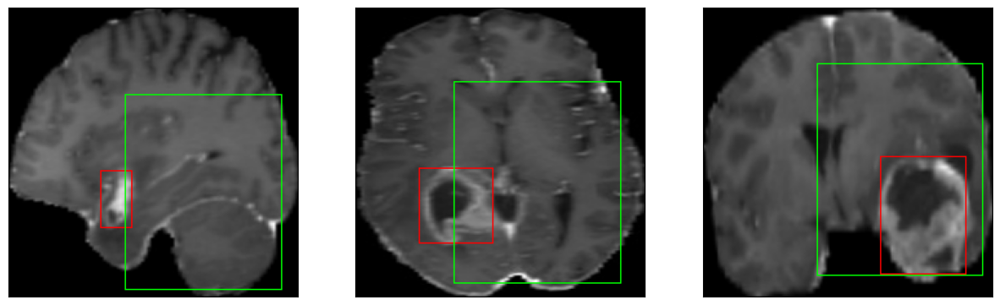

52/52 [==============================] - 20s 381ms/step - loss: 12.3477 - IoU: 0.3854 - val_loss: 74.6404 - val_IoU: 0.0738
Epoch 5/100
52/52 [==============================] - ETA: 0s - loss: 11.5006 - IoU: 0.4265
Epoch 5: val_IoU improved from 0.10000 to 0.14135, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


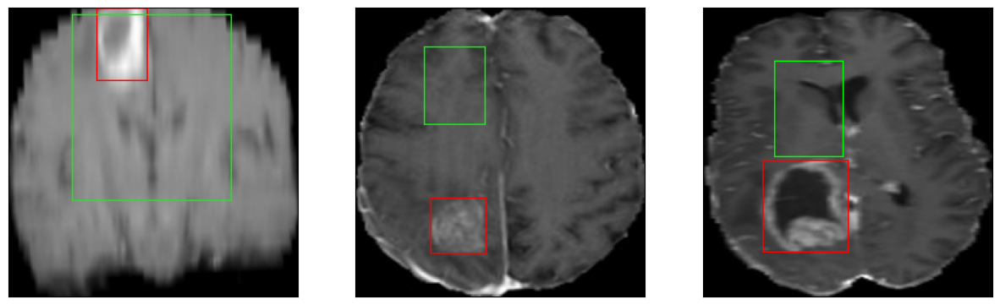

52/52 [==============================] - 33s 644ms/step - loss: 11.5006 - IoU: 0.4265 - val_loss: 32.7280 - val_IoU: 0.1413
Epoch 6/100
52/52 [==============================] - ETA: 0s - loss: 10.5341 - IoU: 0.4529
Epoch 6: val_IoU improved from 0.14135 to 0.37564, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 148ms/step


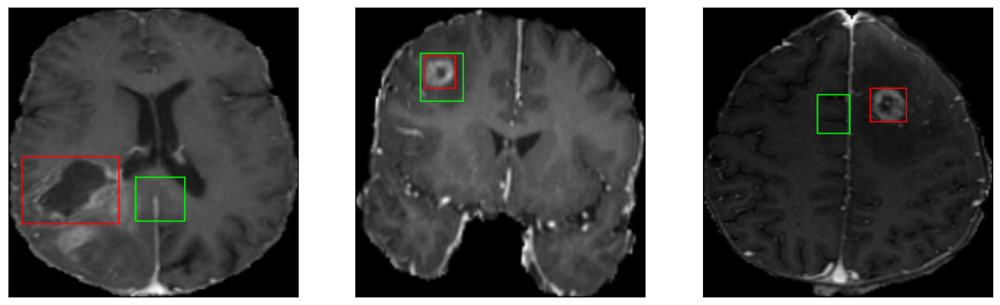

52/52 [==============================] - 33s 637ms/step - loss: 10.5341 - IoU: 0.4529 - val_loss: 12.4282 - val_IoU: 0.3756
Epoch 7/100
52/52 [==============================] - ETA: 0s - loss: 9.8468 - IoU: 0.4656
Epoch 7: val_IoU did not improve from 0.37564
8/8 [==============================] - 1s 150ms/step


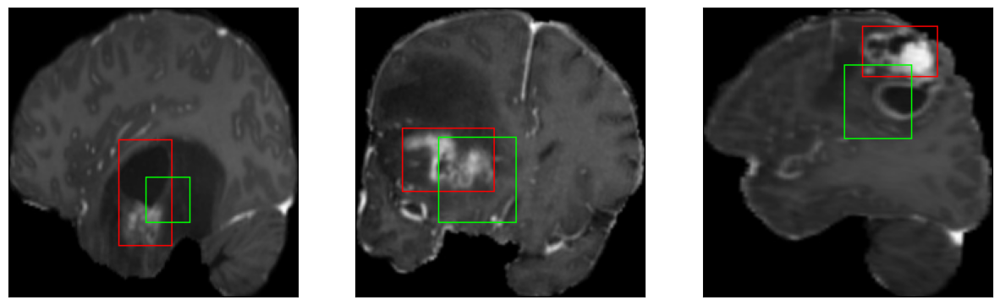

52/52 [==============================] - 20s 386ms/step - loss: 9.8468 - IoU: 0.4656 - val_loss: 15.3505 - val_IoU: 0.3545
Epoch 8/100
52/52 [==============================] - ETA: 0s - loss: 8.9265 - IoU: 0.5035
Epoch 8: val_IoU improved from 0.37564 to 0.55892, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


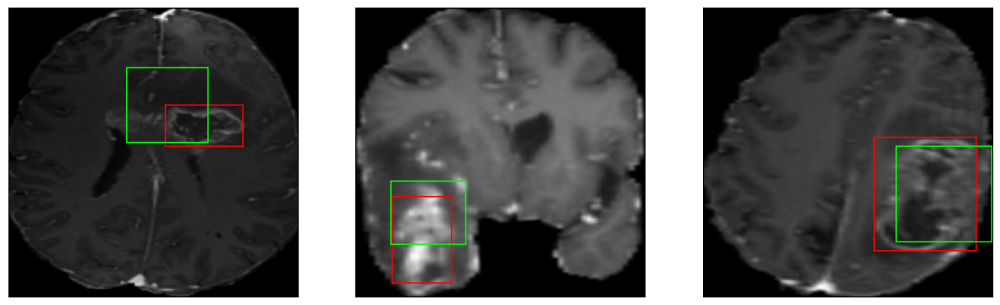

52/52 [==============================] - 32s 630ms/step - loss: 8.9265 - IoU: 0.5035 - val_loss: 9.5465 - val_IoU: 0.5589
Epoch 9/100
52/52 [==============================] - ETA: 0s - loss: 8.6565 - IoU: 0.5107
Epoch 9: val_IoU did not improve from 0.55892
8/8 [==============================] - 1s 148ms/step


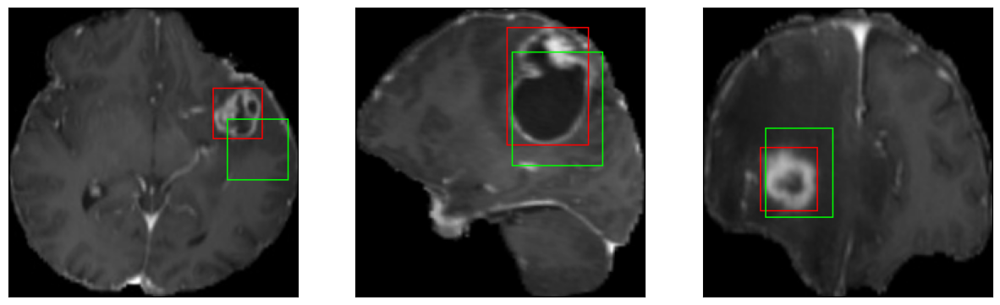

52/52 [==============================] - 20s 379ms/step - loss: 8.6565 - IoU: 0.5107 - val_loss: 17.5319 - val_IoU: 0.2604
Epoch 10/100
52/52 [==============================] - ETA: 0s - loss: 8.4112 - IoU: 0.5199
Epoch 10: val_IoU did not improve from 0.55892
8/8 [==============================] - 1s 151ms/step


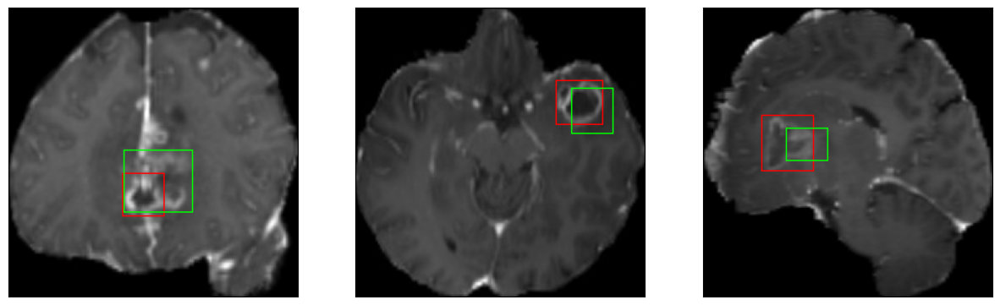

52/52 [==============================] - 20s 388ms/step - loss: 8.4112 - IoU: 0.5199 - val_loss: 10.8147 - val_IoU: 0.4363
Epoch 11/100
52/52 [==============================] - ETA: 0s - loss: 7.8413 - IoU: 0.5473
Epoch 11: val_IoU improved from 0.55892 to 0.60554, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


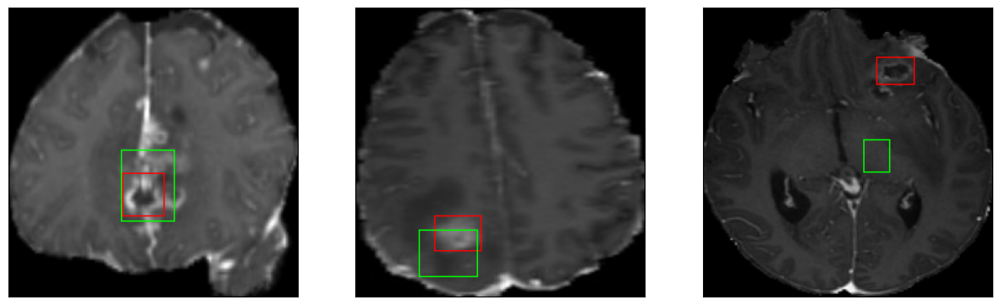

52/52 [==============================] - 35s 679ms/step - loss: 7.8413 - IoU: 0.5473 - val_loss: 7.5167 - val_IoU: 0.6055
Epoch 12/100
52/52 [==============================] - ETA: 0s - loss: 7.7278 - IoU: 0.5515
Epoch 12: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 147ms/step


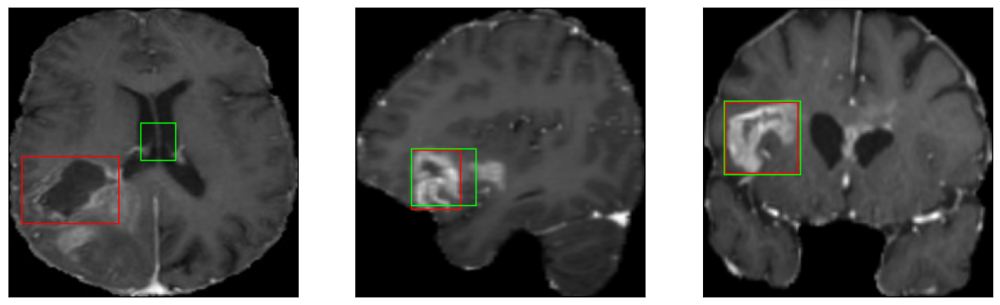

52/52 [==============================] - 20s 379ms/step - loss: 7.7278 - IoU: 0.5515 - val_loss: 7.9721 - val_IoU: 0.5734
Epoch 13/100
52/52 [==============================] - ETA: 0s - loss: 7.7957 - IoU: 0.5441
Epoch 13: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 152ms/step


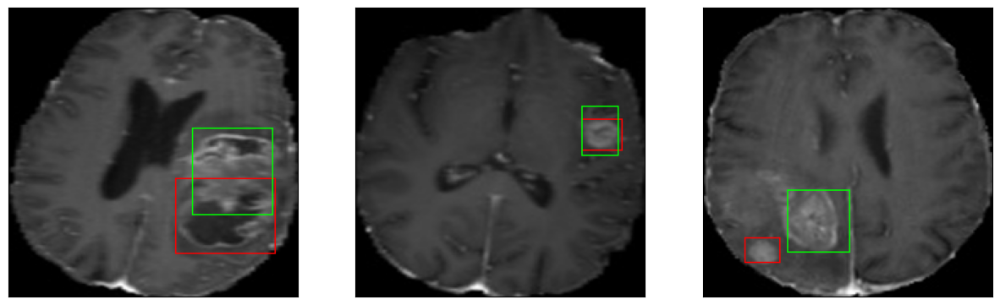

52/52 [==============================] - 20s 390ms/step - loss: 7.7957 - IoU: 0.5441 - val_loss: 7.3334 - val_IoU: 0.5941
Epoch 14/100
52/52 [==============================] - ETA: 0s - loss: 7.9084 - IoU: 0.5321
Epoch 14: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 147ms/step


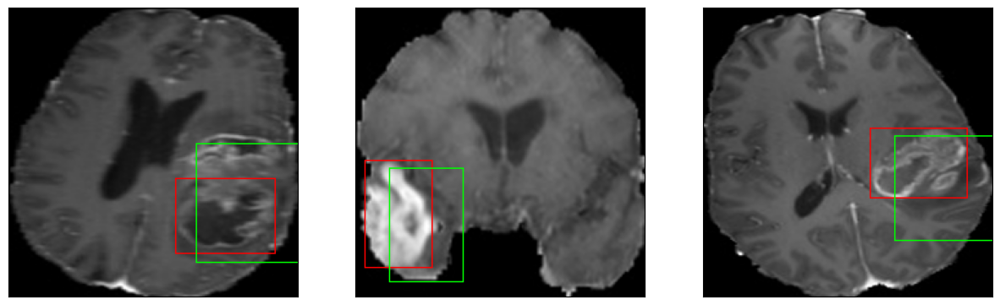

52/52 [==============================] - 20s 387ms/step - loss: 7.9084 - IoU: 0.5321 - val_loss: 13.9007 - val_IoU: 0.3847
Epoch 15/100
52/52 [==============================] - ETA: 0s - loss: 7.8353 - IoU: 0.5309
Epoch 15: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 146ms/step


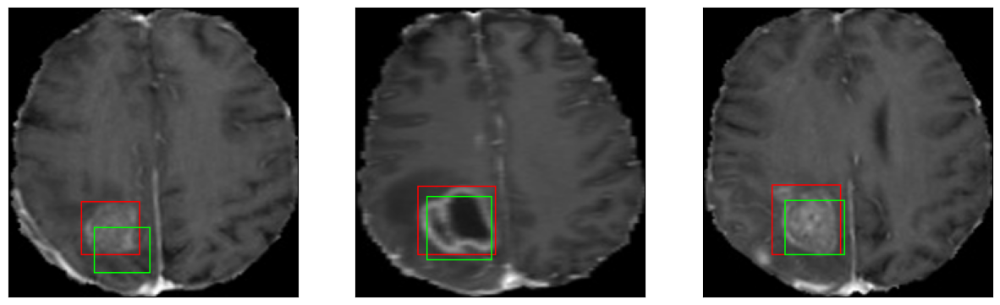

52/52 [==============================] - 20s 390ms/step - loss: 7.8353 - IoU: 0.5309 - val_loss: 8.8932 - val_IoU: 0.5531
Epoch 16/100
52/52 [==============================] - ETA: 0s - loss: 7.0019 - IoU: 0.5677
Epoch 16: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 145ms/step


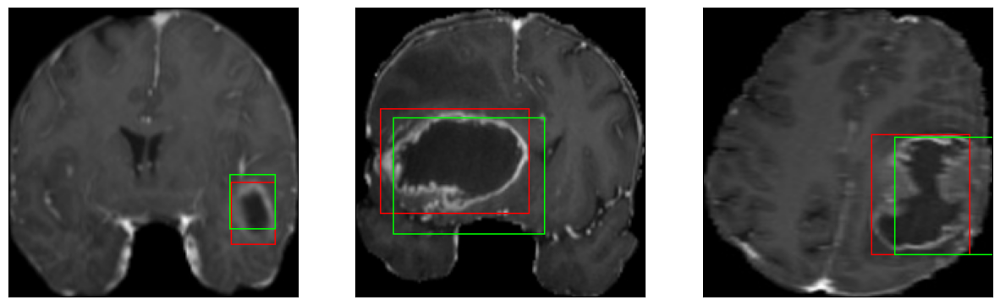

52/52 [==============================] - 19s 375ms/step - loss: 7.0019 - IoU: 0.5677 - val_loss: 7.3900 - val_IoU: 0.6054
Epoch 17/100
52/52 [==============================] - ETA: 0s - loss: 7.1195 - IoU: 0.5638
Epoch 17: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 148ms/step


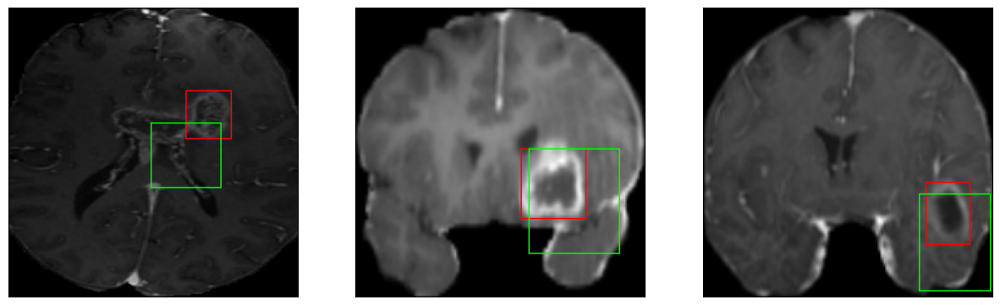

52/52 [==============================] - 20s 379ms/step - loss: 7.1195 - IoU: 0.5638 - val_loss: 11.7432 - val_IoU: 0.4317
Epoch 18/100
52/52 [==============================] - ETA: 0s - loss: 6.6331 - IoU: 0.5837
Epoch 18: val_IoU did not improve from 0.60554
8/8 [==============================] - 1s 145ms/step


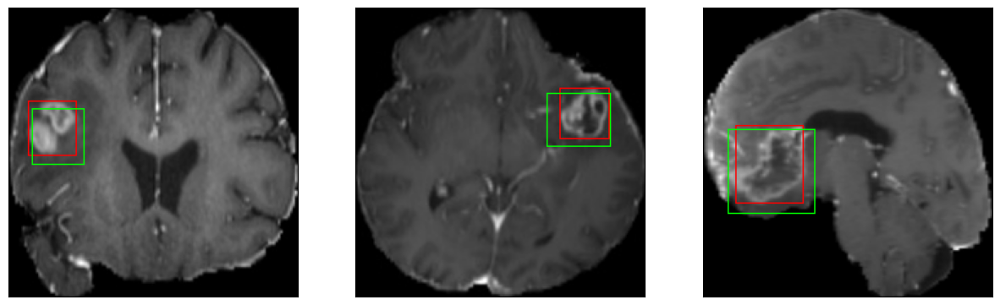

52/52 [==============================] - 20s 381ms/step - loss: 6.6331 - IoU: 0.5837 - val_loss: 8.8618 - val_IoU: 0.5504
Epoch 19/100
52/52 [==============================] - ETA: 0s - loss: 6.5853 - IoU: 0.5858
Epoch 19: val_IoU improved from 0.60554 to 0.60720, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


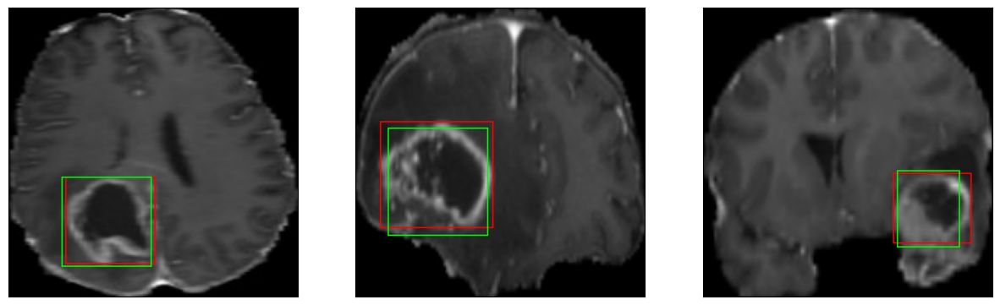

52/52 [==============================] - 32s 614ms/step - loss: 6.5853 - IoU: 0.5858 - val_loss: 6.9867 - val_IoU: 0.6072
Epoch 20/100
52/52 [==============================] - ETA: 0s - loss: 6.3398 - IoU: 0.5935
Epoch 20: val_IoU did not improve from 0.60720
8/8 [==============================] - 1s 149ms/step


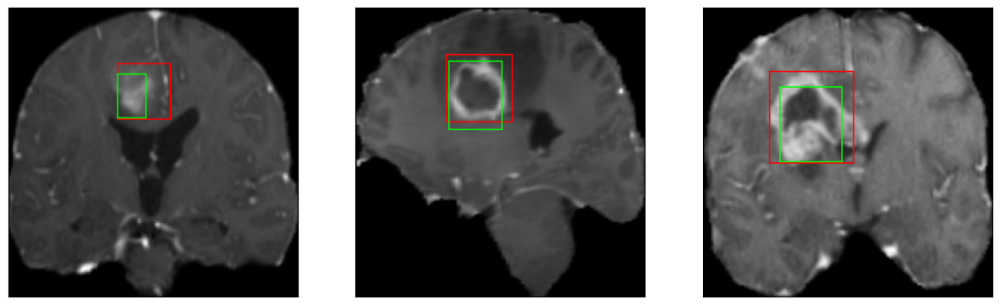

52/52 [==============================] - 20s 388ms/step - loss: 6.3398 - IoU: 0.5935 - val_loss: 8.2523 - val_IoU: 0.5606
Epoch 21/100
52/52 [==============================] - ETA: 0s - loss: 6.6694 - IoU: 0.5873
Epoch 21: val_IoU improved from 0.60720 to 0.62310, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


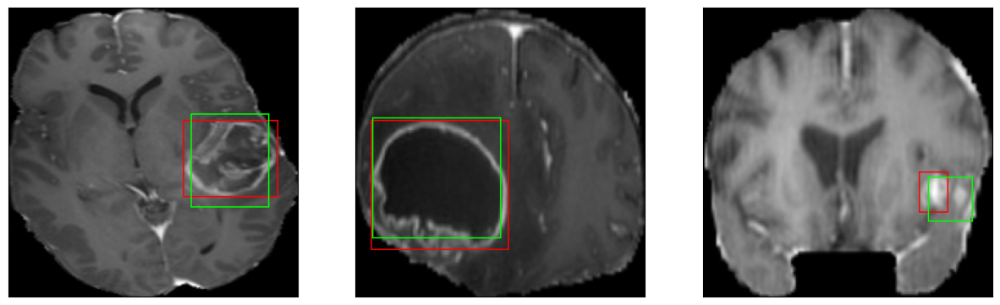

52/52 [==============================] - 34s 661ms/step - loss: 6.6694 - IoU: 0.5873 - val_loss: 7.5820 - val_IoU: 0.6231
Epoch 22/100
52/52 [==============================] - ETA: 0s - loss: 6.6758 - IoU: 0.5717
Epoch 22: val_IoU did not improve from 0.62310
8/8 [==============================] - 1s 151ms/step


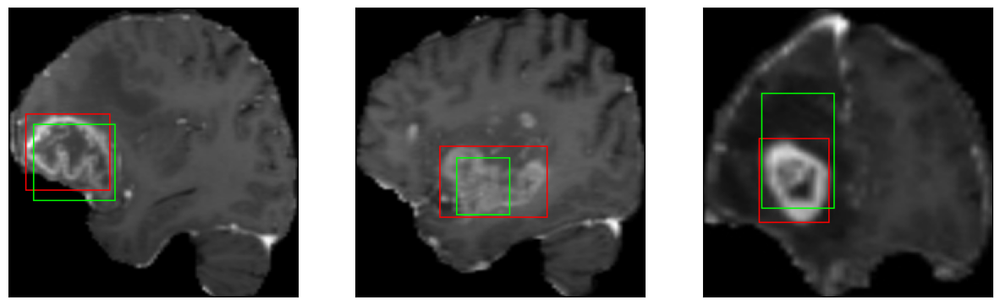

52/52 [==============================] - 20s 384ms/step - loss: 6.6758 - IoU: 0.5717 - val_loss: 9.4864 - val_IoU: 0.4643
Epoch 23/100
52/52 [==============================] - ETA: 0s - loss: 7.0107 - IoU: 0.5585
Epoch 23: val_IoU did not improve from 0.62310
8/8 [==============================] - 1s 149ms/step


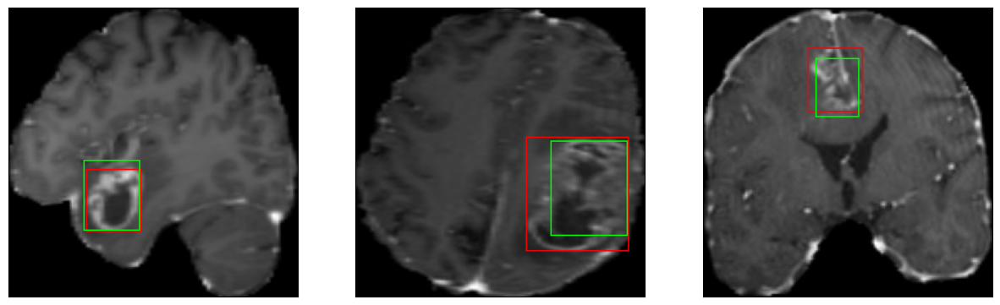

52/52 [==============================] - 20s 391ms/step - loss: 7.0107 - IoU: 0.5585 - val_loss: 8.3858 - val_IoU: 0.5934
Epoch 24/100
52/52 [==============================] - ETA: 0s - loss: 6.2722 - IoU: 0.6000
Epoch 24: val_IoU did not improve from 0.62310
8/8 [==============================] - 1s 145ms/step


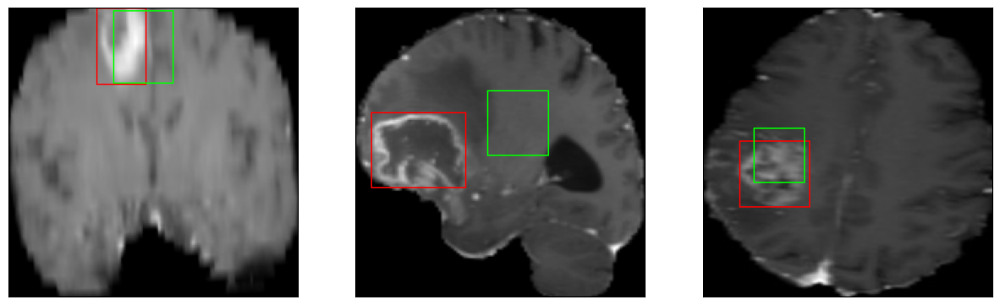

52/52 [==============================] - 20s 383ms/step - loss: 6.2722 - IoU: 0.6000 - val_loss: 15.2308 - val_IoU: 0.3666
Epoch 25/100
52/52 [==============================] - ETA: 0s - loss: 6.5853 - IoU: 0.5722
Epoch 25: val_IoU did not improve from 0.62310
8/8 [==============================] - 1s 144ms/step


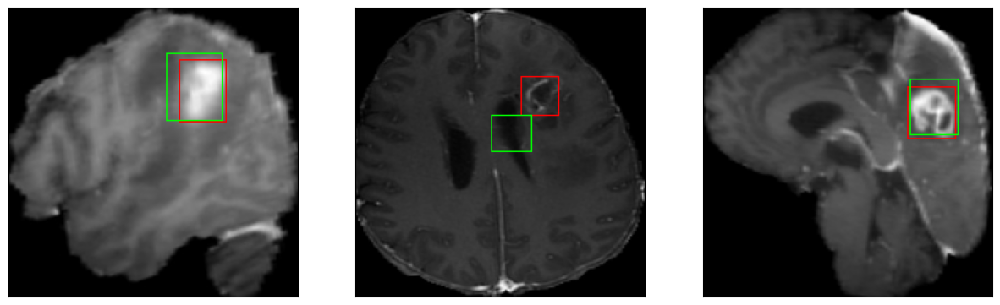

52/52 [==============================] - 20s 388ms/step - loss: 6.5853 - IoU: 0.5722 - val_loss: 7.7036 - val_IoU: 0.6162
Epoch 26/100
52/52 [==============================] - ETA: 0s - loss: 6.4434 - IoU: 0.5937
Epoch 26: val_IoU did not improve from 0.62310
8/8 [==============================] - 1s 147ms/step


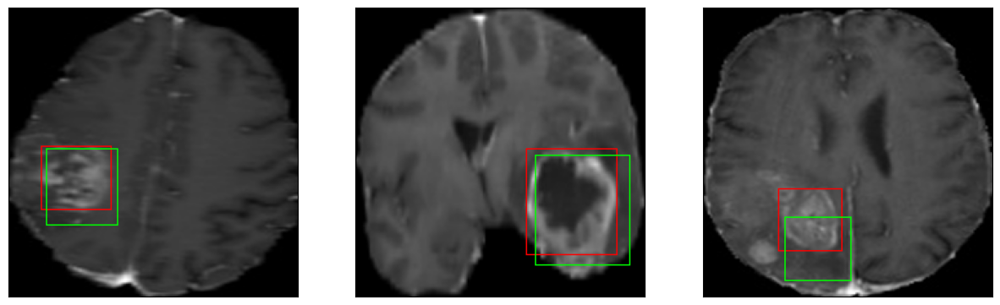

52/52 [==============================] - 20s 383ms/step - loss: 6.4434 - IoU: 0.5937 - val_loss: 10.7030 - val_IoU: 0.4510
Epoch 27/100
52/52 [==============================] - ETA: 0s - loss: 6.2302 - IoU: 0.5977
Epoch 27: val_IoU improved from 0.62310 to 0.62825, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


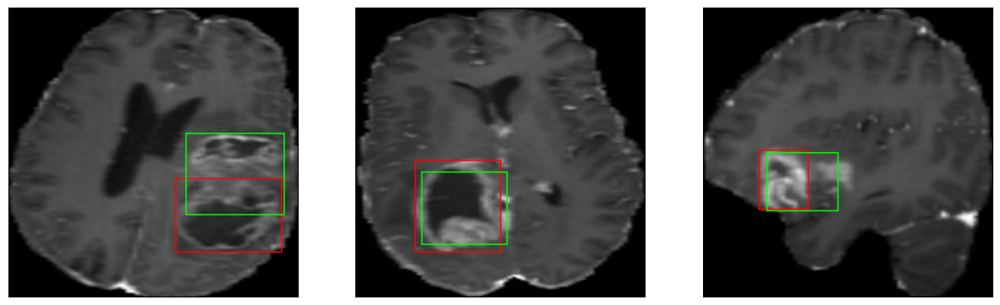

52/52 [==============================] - 41s 801ms/step - loss: 6.2302 - IoU: 0.5977 - val_loss: 6.7590 - val_IoU: 0.6282
Epoch 28/100
52/52 [==============================] - ETA: 0s - loss: 6.2148 - IoU: 0.5955
Epoch 28: val_IoU did not improve from 0.62825
8/8 [==============================] - 1s 149ms/step


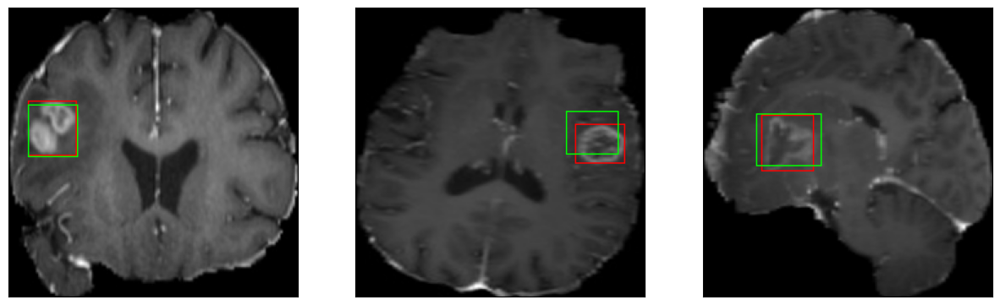

52/52 [==============================] - 20s 386ms/step - loss: 6.2148 - IoU: 0.5955 - val_loss: 7.0741 - val_IoU: 0.6175
Epoch 29/100
52/52 [==============================] - ETA: 0s - loss: 6.0376 - IoU: 0.6121
Epoch 29: val_IoU did not improve from 0.62825
8/8 [==============================] - 1s 151ms/step


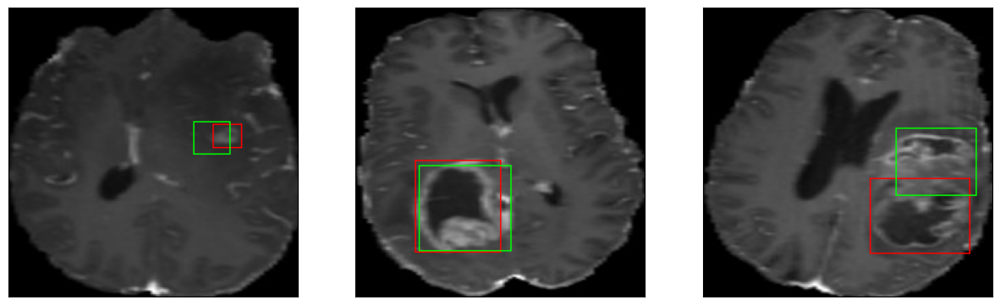

52/52 [==============================] - 20s 390ms/step - loss: 6.0376 - IoU: 0.6121 - val_loss: 7.8342 - val_IoU: 0.6132
Epoch 30/100
52/52 [==============================] - ETA: 0s - loss: 5.8882 - IoU: 0.6117
Epoch 30: val_IoU did not improve from 0.62825
8/8 [==============================] - 1s 145ms/step


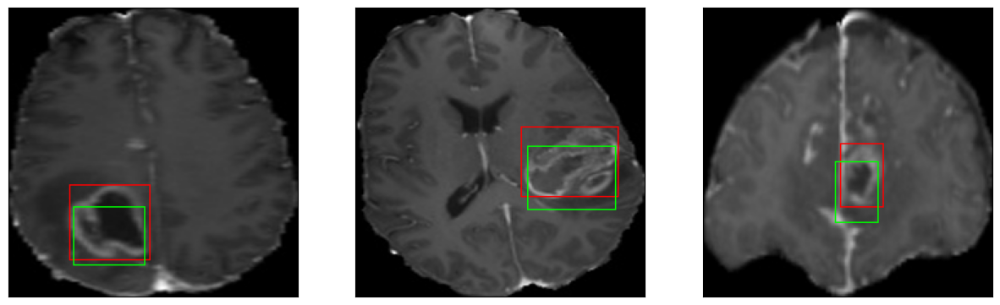

52/52 [==============================] - 20s 383ms/step - loss: 5.8882 - IoU: 0.6117 - val_loss: 8.8606 - val_IoU: 0.5703
Epoch 31/100
52/52 [==============================] - ETA: 0s - loss: 5.6847 - IoU: 0.6260
Epoch 31: val_IoU improved from 0.62825 to 0.64862, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 143ms/step


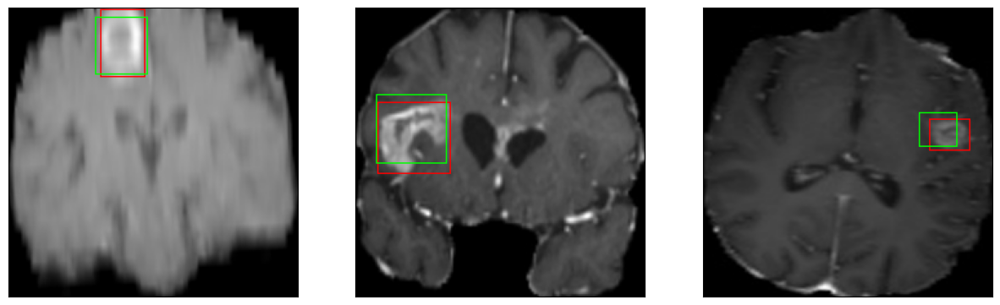

52/52 [==============================] - 38s 746ms/step - loss: 5.6847 - IoU: 0.6260 - val_loss: 6.3105 - val_IoU: 0.6486
Epoch 32/100
52/52 [==============================] - ETA: 0s - loss: 5.8287 - IoU: 0.6136
Epoch 32: val_IoU did not improve from 0.64862
8/8 [==============================] - 1s 150ms/step


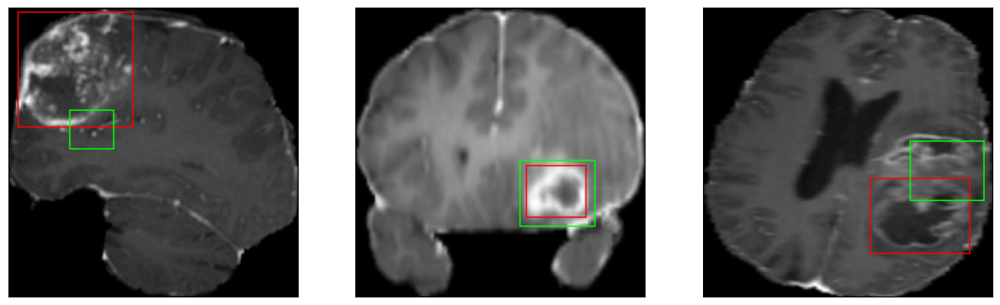

52/52 [==============================] - 20s 390ms/step - loss: 5.8287 - IoU: 0.6136 - val_loss: 9.4898 - val_IoU: 0.5784
Epoch 33/100
52/52 [==============================] - ETA: 0s - loss: 5.5443 - IoU: 0.6269
Epoch 33: val_IoU improved from 0.64862 to 0.66364, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 145ms/step


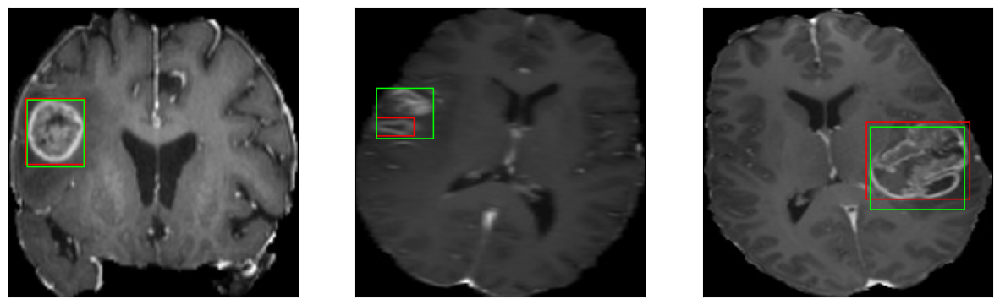

52/52 [==============================] - 40s 784ms/step - loss: 5.5443 - IoU: 0.6269 - val_loss: 6.6194 - val_IoU: 0.6636
Epoch 34/100
52/52 [==============================] - ETA: 0s - loss: 5.6575 - IoU: 0.6278
Epoch 34: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 151ms/step


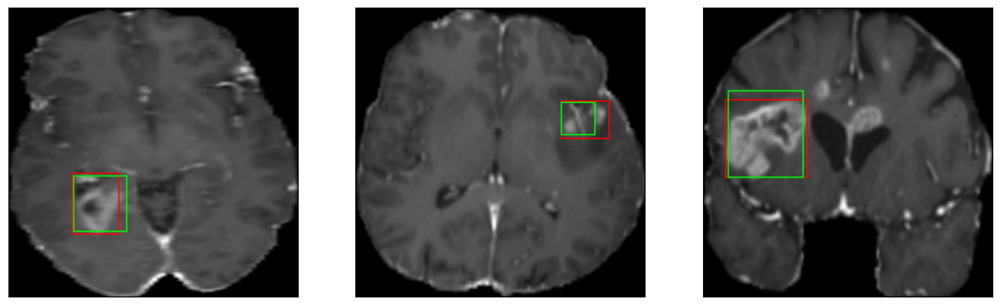

52/52 [==============================] - 20s 385ms/step - loss: 5.6575 - IoU: 0.6278 - val_loss: 6.7899 - val_IoU: 0.6340
Epoch 35/100
52/52 [==============================] - ETA: 0s - loss: 5.6800 - IoU: 0.6199
Epoch 35: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 151ms/step


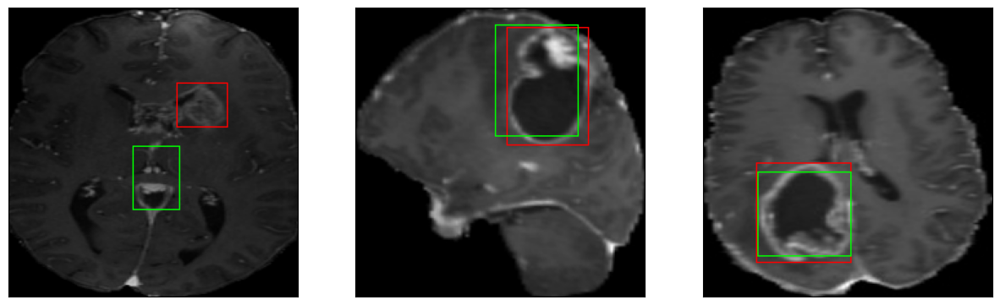

52/52 [==============================] - 20s 393ms/step - loss: 5.6800 - IoU: 0.6199 - val_loss: 7.2234 - val_IoU: 0.6149
Epoch 36/100
52/52 [==============================] - ETA: 0s - loss: 5.6658 - IoU: 0.6166
Epoch 36: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 145ms/step


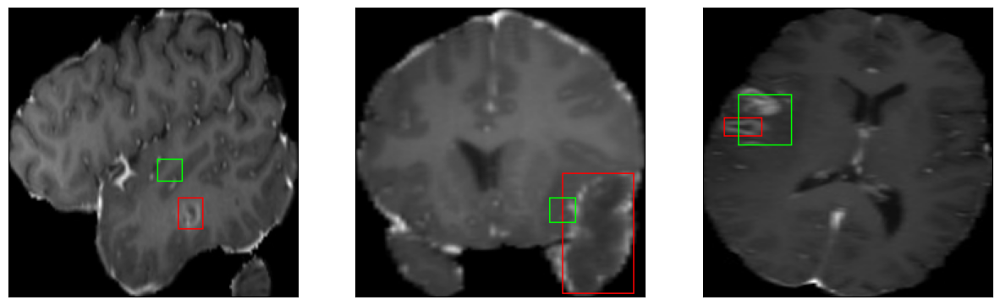

52/52 [==============================] - 21s 402ms/step - loss: 5.6658 - IoU: 0.6166 - val_loss: 8.0796 - val_IoU: 0.5863
Epoch 37/100
52/52 [==============================] - ETA: 0s - loss: 5.6633 - IoU: 0.6248
Epoch 37: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 146ms/step


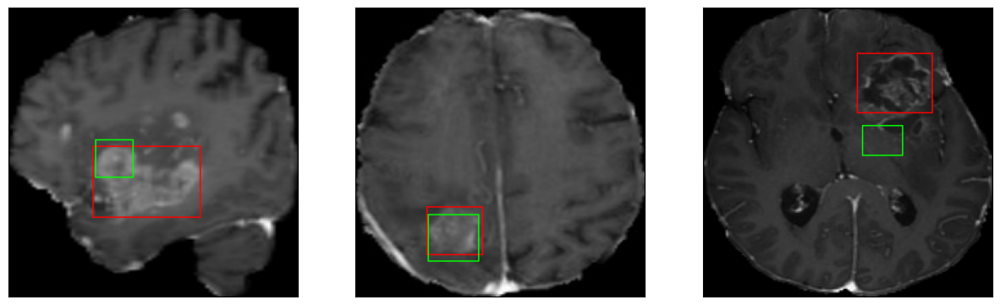

52/52 [==============================] - 20s 381ms/step - loss: 5.6633 - IoU: 0.6248 - val_loss: 7.3485 - val_IoU: 0.6281
Epoch 38/100
52/52 [==============================] - ETA: 0s - loss: 5.5418 - IoU: 0.6206
Epoch 38: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 152ms/step


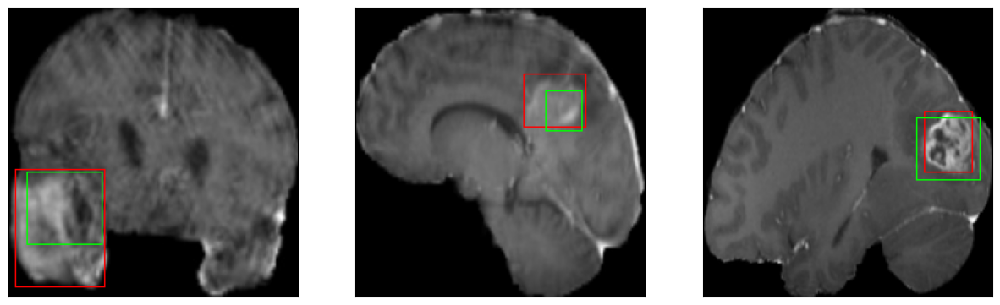

52/52 [==============================] - 20s 391ms/step - loss: 5.5418 - IoU: 0.6206 - val_loss: 7.2634 - val_IoU: 0.6048
Epoch 39/100
52/52 [==============================] - ETA: 0s - loss: 5.5263 - IoU: 0.6235
Epoch 39: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


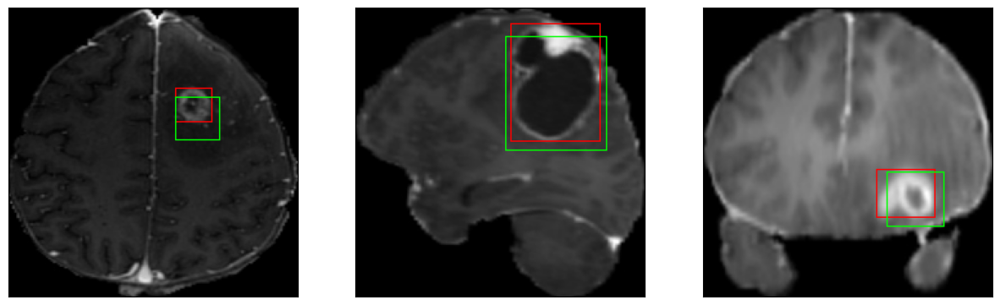

52/52 [==============================] - 20s 389ms/step - loss: 5.5263 - IoU: 0.6235 - val_loss: 7.7233 - val_IoU: 0.5832
Epoch 40/100
52/52 [==============================] - ETA: 0s - loss: 5.4615 - IoU: 0.6278
Epoch 40: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


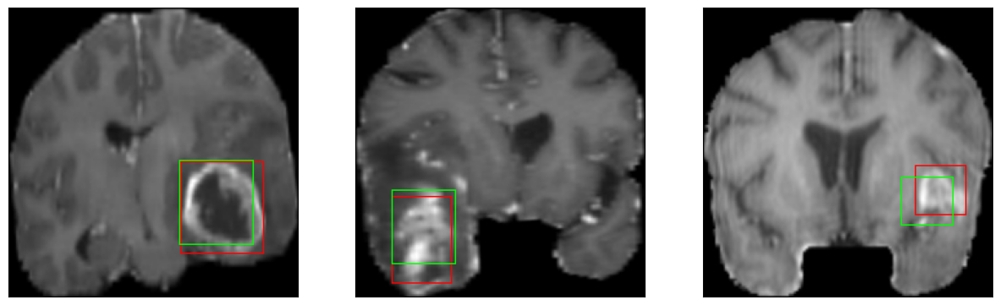

52/52 [==============================] - 20s 388ms/step - loss: 5.4615 - IoU: 0.6278 - val_loss: 8.1929 - val_IoU: 0.6169
Epoch 41/100
52/52 [==============================] - ETA: 0s - loss: 5.7662 - IoU: 0.6072
Epoch 41: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 144ms/step


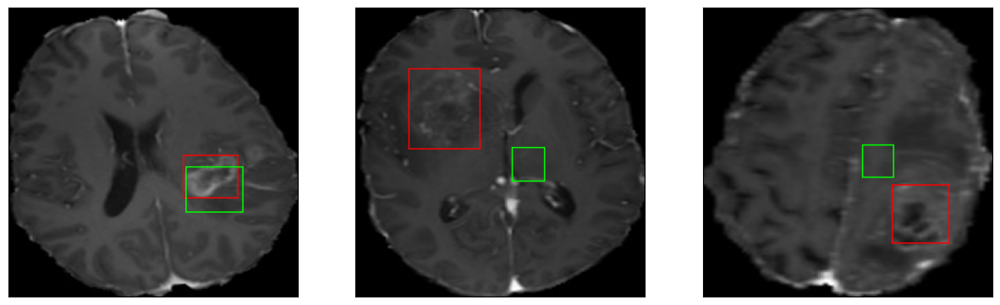

52/52 [==============================] - 20s 379ms/step - loss: 5.7662 - IoU: 0.6072 - val_loss: 8.3932 - val_IoU: 0.5413
Epoch 42/100
52/52 [==============================] - ETA: 0s - loss: 5.4468 - IoU: 0.6342
Epoch 42: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


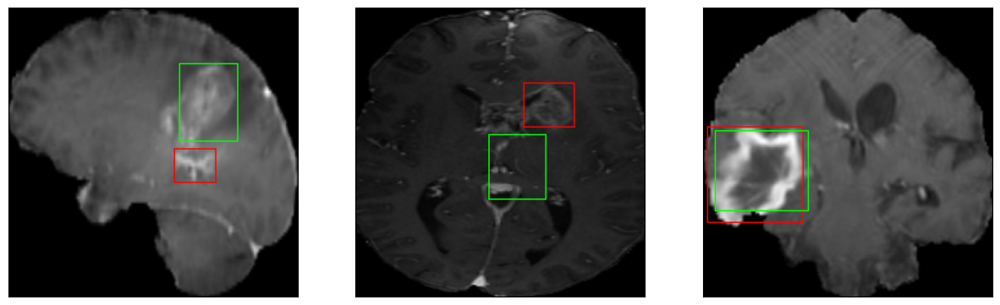

52/52 [==============================] - 20s 384ms/step - loss: 5.4468 - IoU: 0.6342 - val_loss: 6.9878 - val_IoU: 0.6470
Epoch 43/100
52/52 [==============================] - ETA: 0s - loss: 5.4957 - IoU: 0.6342
Epoch 43: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 147ms/step


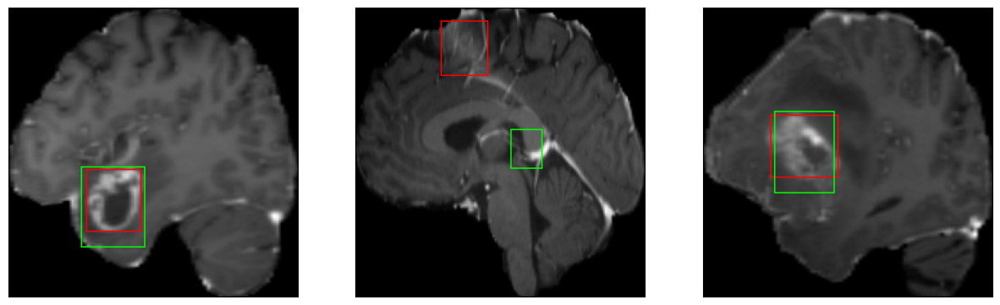

52/52 [==============================] - 20s 389ms/step - loss: 5.4957 - IoU: 0.6342 - val_loss: 7.7586 - val_IoU: 0.6156
Epoch 44/100
52/52 [==============================] - ETA: 0s - loss: 5.1498 - IoU: 0.6365
Epoch 44: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 145ms/step


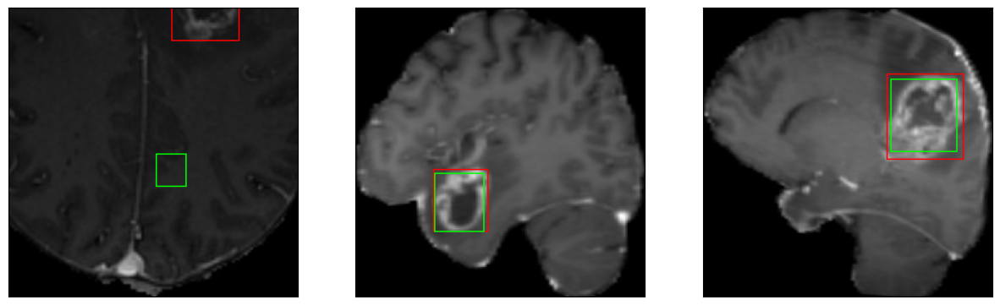

52/52 [==============================] - 20s 382ms/step - loss: 5.1498 - IoU: 0.6365 - val_loss: 8.8557 - val_IoU: 0.5928
Epoch 45/100
52/52 [==============================] - ETA: 0s - loss: 5.0420 - IoU: 0.6536
Epoch 45: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 146ms/step


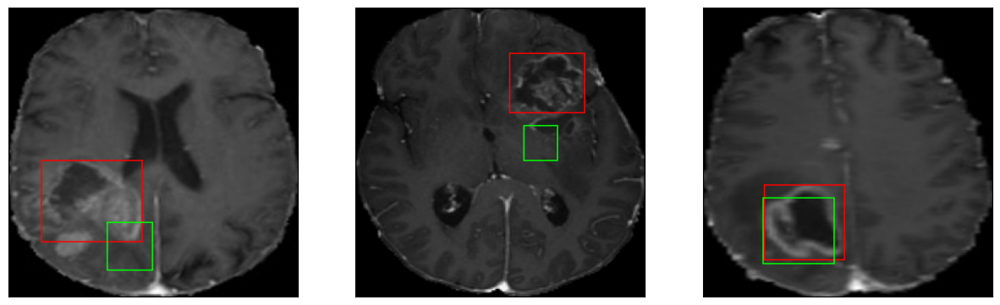

52/52 [==============================] - 20s 387ms/step - loss: 5.0420 - IoU: 0.6536 - val_loss: 6.9494 - val_IoU: 0.6494
Epoch 46/100
52/52 [==============================] - ETA: 0s - loss: 4.9944 - IoU: 0.6531
Epoch 46: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 147ms/step


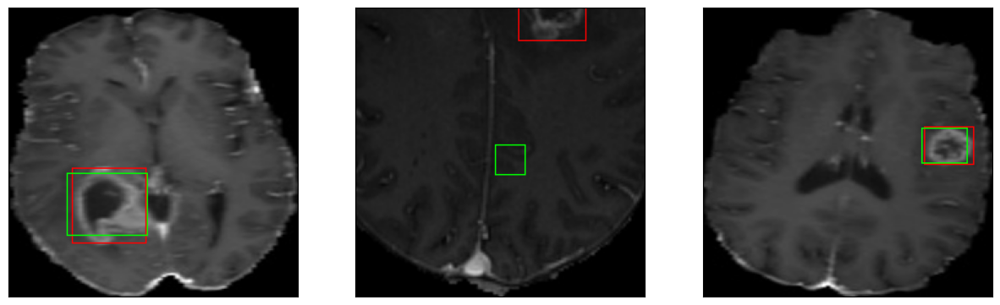

52/52 [==============================] - 20s 382ms/step - loss: 4.9944 - IoU: 0.6531 - val_loss: 7.9090 - val_IoU: 0.6111
Epoch 47/100
52/52 [==============================] - ETA: 0s - loss: 5.3901 - IoU: 0.6303
Epoch 47: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 144ms/step


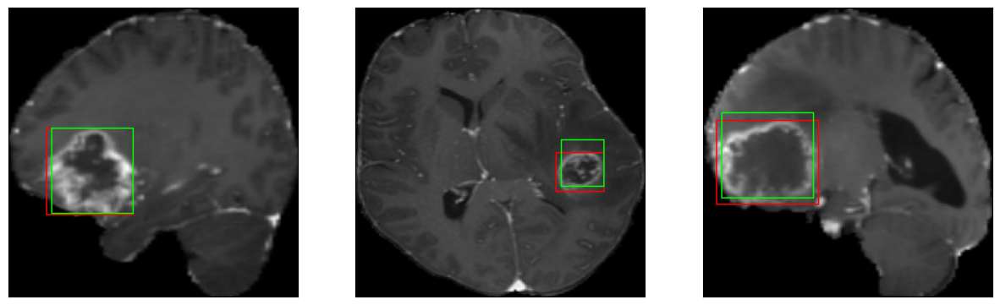

52/52 [==============================] - 20s 384ms/step - loss: 5.3901 - IoU: 0.6303 - val_loss: 6.9562 - val_IoU: 0.6362
Epoch 48/100
52/52 [==============================] - ETA: 0s - loss: 5.3707 - IoU: 0.6334
Epoch 48: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 145ms/step


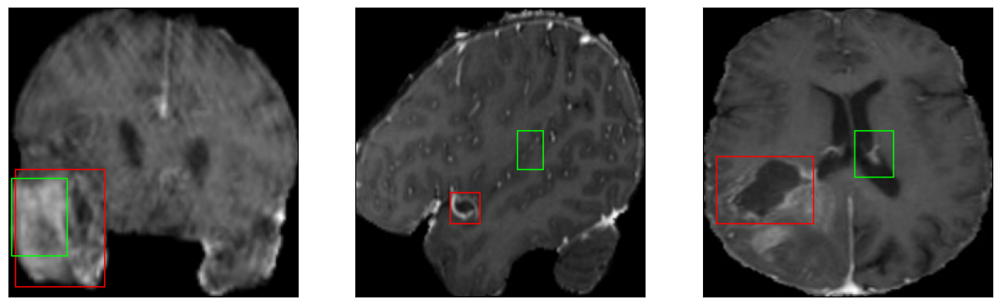

52/52 [==============================] - 20s 383ms/step - loss: 5.3707 - IoU: 0.6334 - val_loss: 6.7671 - val_IoU: 0.6392
Epoch 49/100
52/52 [==============================] - ETA: 0s - loss: 5.1532 - IoU: 0.6444
Epoch 49: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


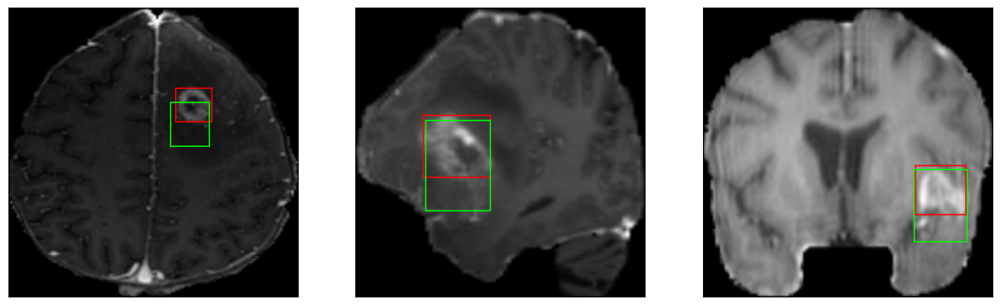

52/52 [==============================] - 20s 391ms/step - loss: 5.1532 - IoU: 0.6444 - val_loss: 7.4375 - val_IoU: 0.6035
Epoch 50/100
52/52 [==============================] - ETA: 0s - loss: 5.1192 - IoU: 0.6462
Epoch 50: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 146ms/step


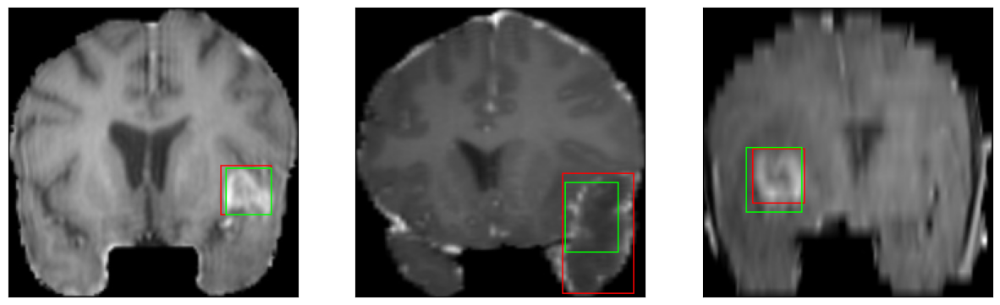

52/52 [==============================] - 20s 387ms/step - loss: 5.1192 - IoU: 0.6462 - val_loss: 8.1201 - val_IoU: 0.5900
Epoch 51/100
52/52 [==============================] - ETA: 0s - loss: 5.2339 - IoU: 0.6428
Epoch 51: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 145ms/step


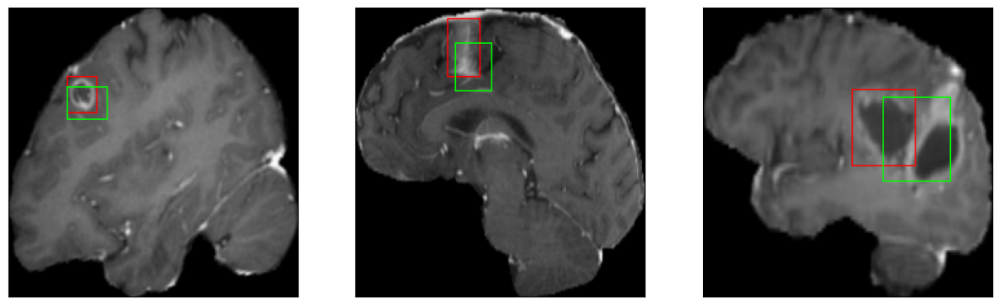

52/52 [==============================] - 20s 383ms/step - loss: 5.2339 - IoU: 0.6428 - val_loss: 7.0747 - val_IoU: 0.6411
Epoch 52/100
52/52 [==============================] - ETA: 0s - loss: 5.3085 - IoU: 0.6336
Epoch 52: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


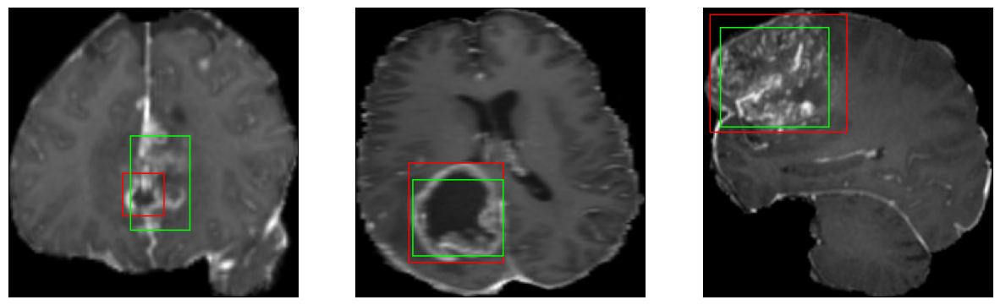

52/52 [==============================] - 21s 397ms/step - loss: 5.3085 - IoU: 0.6336 - val_loss: 6.9900 - val_IoU: 0.6387
Epoch 53/100
52/52 [==============================] - ETA: 0s - loss: 4.9304 - IoU: 0.6552
Epoch 53: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 146ms/step


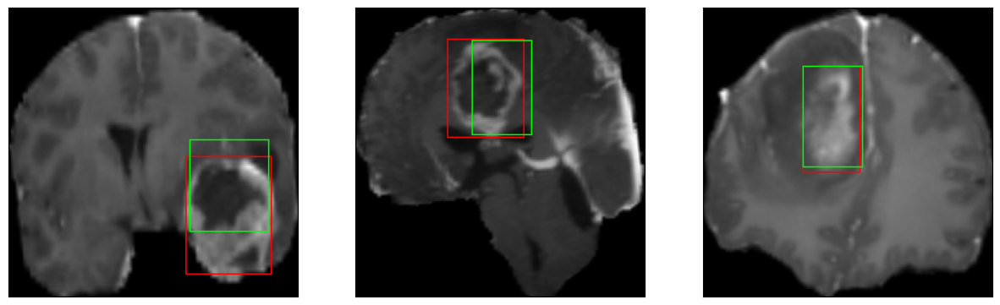

52/52 [==============================] - 20s 383ms/step - loss: 4.9304 - IoU: 0.6552 - val_loss: 7.1087 - val_IoU: 0.6539
Epoch 54/100
52/52 [==============================] - ETA: 0s - loss: 5.0624 - IoU: 0.6495
Epoch 54: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 149ms/step


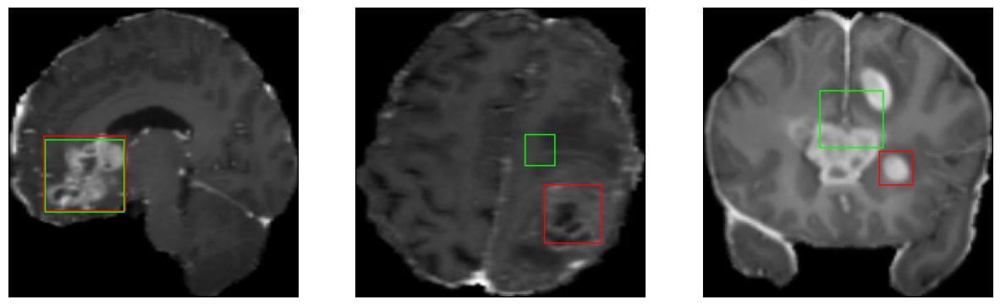

52/52 [==============================] - 20s 389ms/step - loss: 5.0624 - IoU: 0.6495 - val_loss: 7.4809 - val_IoU: 0.6267
Epoch 55/100
52/52 [==============================] - ETA: 0s - loss: 5.2684 - IoU: 0.6366
Epoch 55: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 148ms/step


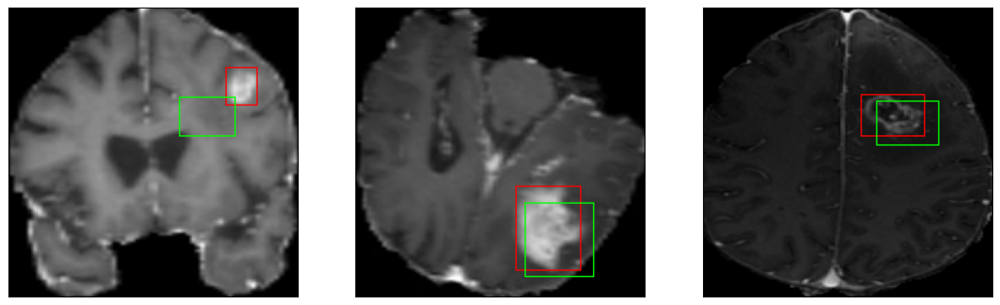

52/52 [==============================] - 20s 391ms/step - loss: 5.2684 - IoU: 0.6366 - val_loss: 9.8288 - val_IoU: 0.4380
Epoch 56/100
52/52 [==============================] - ETA: 0s - loss: 4.9517 - IoU: 0.6576
Epoch 56: val_IoU did not improve from 0.66364
8/8 [==============================] - 1s 147ms/step


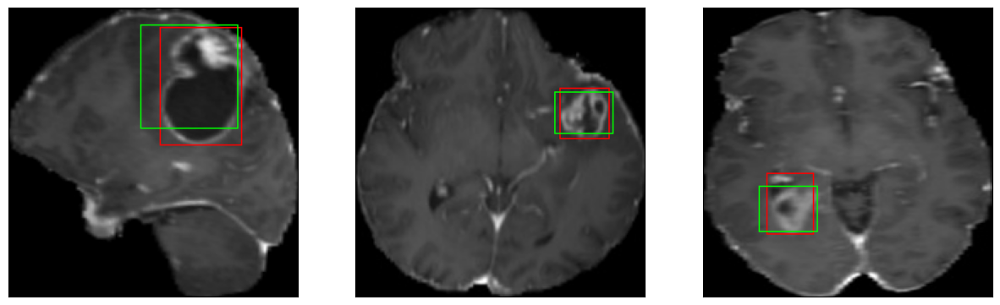

52/52 [==============================] - 20s 382ms/step - loss: 4.9517 - IoU: 0.6576 - val_loss: 7.0767 - val_IoU: 0.6485
Epoch 57/100
52/52 [==============================] - ETA: 0s - loss: 5.1526 - IoU: 0.6458
Epoch 57: val_IoU improved from 0.66364 to 0.66439, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 144ms/step


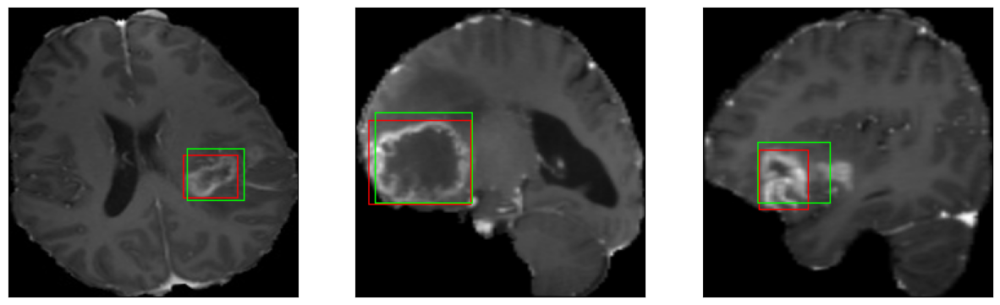

52/52 [==============================] - 39s 762ms/step - loss: 5.1526 - IoU: 0.6458 - val_loss: 6.4334 - val_IoU: 0.6644
Epoch 58/100
52/52 [==============================] - ETA: 0s - loss: 4.9145 - IoU: 0.6598
Epoch 58: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 149ms/step


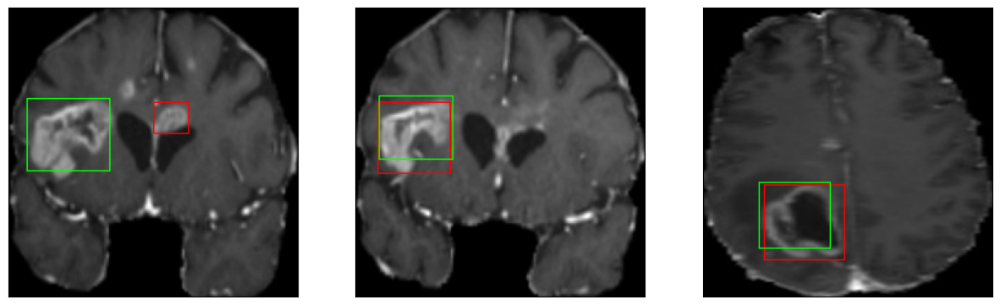

52/52 [==============================] - 20s 394ms/step - loss: 4.9145 - IoU: 0.6598 - val_loss: 7.7932 - val_IoU: 0.6296
Epoch 59/100
52/52 [==============================] - ETA: 0s - loss: 5.0954 - IoU: 0.6434
Epoch 59: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 152ms/step


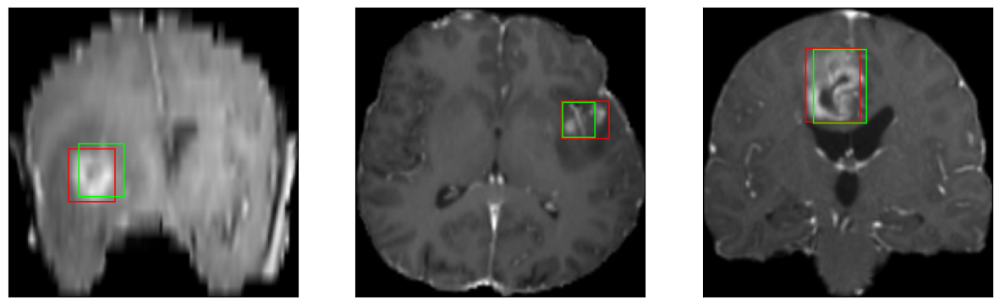

52/52 [==============================] - 21s 396ms/step - loss: 5.0954 - IoU: 0.6434 - val_loss: 7.3500 - val_IoU: 0.6221
Epoch 60/100
52/52 [==============================] - ETA: 0s - loss: 4.8100 - IoU: 0.6594
Epoch 60: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


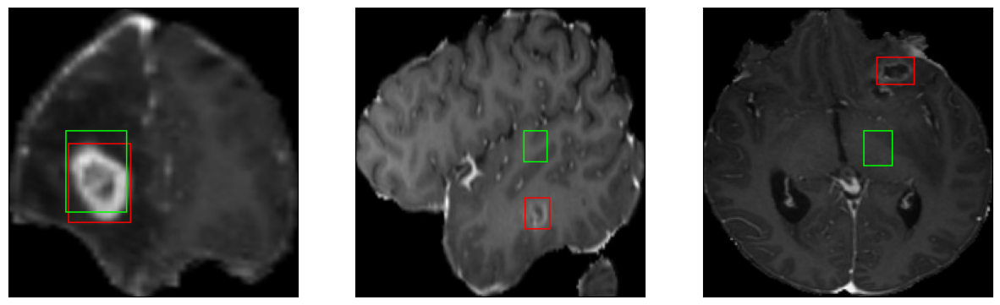

52/52 [==============================] - 20s 389ms/step - loss: 4.8100 - IoU: 0.6594 - val_loss: 6.7627 - val_IoU: 0.6430
Epoch 61/100
52/52 [==============================] - ETA: 0s - loss: 5.1466 - IoU: 0.6326
Epoch 61: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 146ms/step


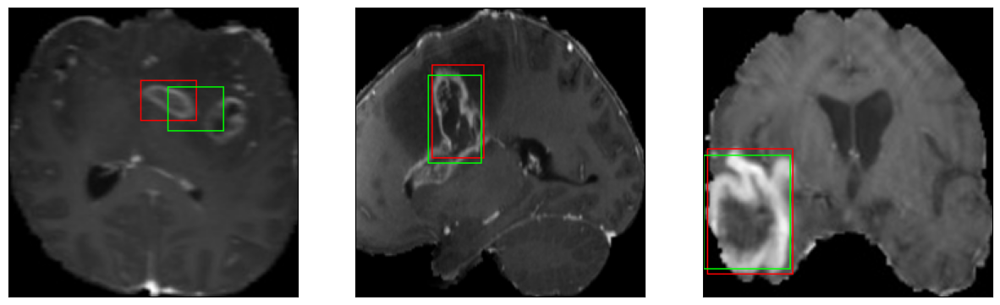

52/52 [==============================] - 20s 395ms/step - loss: 5.1466 - IoU: 0.6326 - val_loss: 9.4933 - val_IoU: 0.5721
Epoch 62/100
52/52 [==============================] - ETA: 0s - loss: 5.2707 - IoU: 0.6388
Epoch 62: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 146ms/step


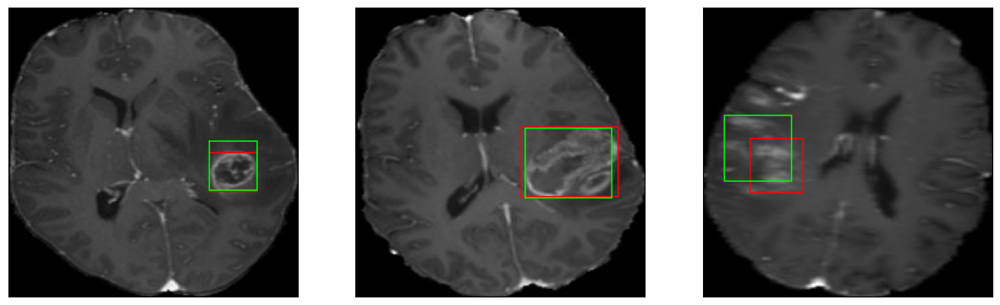

52/52 [==============================] - 20s 384ms/step - loss: 5.2707 - IoU: 0.6388 - val_loss: 7.4640 - val_IoU: 0.6201
Epoch 63/100
52/52 [==============================] - ETA: 0s - loss: 4.8112 - IoU: 0.6542
Epoch 63: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 149ms/step


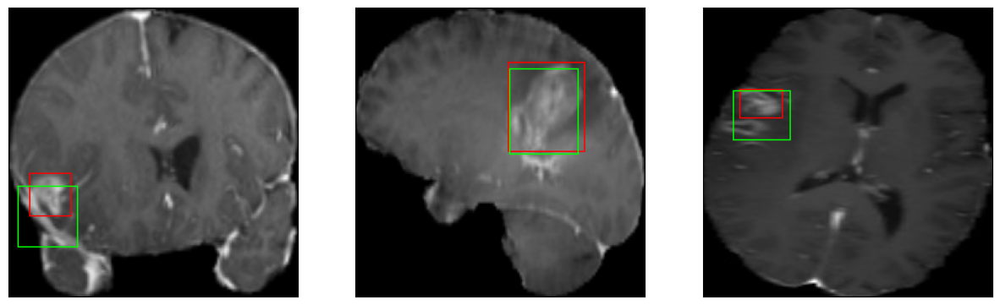

52/52 [==============================] - 20s 387ms/step - loss: 4.8112 - IoU: 0.6542 - val_loss: 7.5223 - val_IoU: 0.6523
Epoch 64/100
52/52 [==============================] - ETA: 0s - loss: 4.8462 - IoU: 0.6577
Epoch 64: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


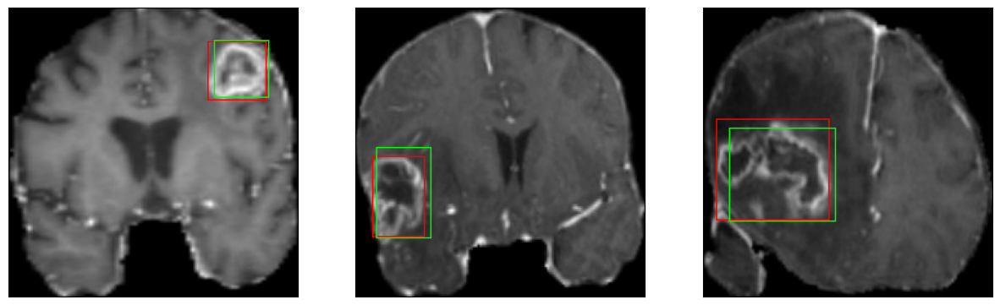

52/52 [==============================] - 20s 395ms/step - loss: 4.8462 - IoU: 0.6577 - val_loss: 7.2154 - val_IoU: 0.6186
Epoch 65/100
52/52 [==============================] - ETA: 0s - loss: 4.8258 - IoU: 0.6552
Epoch 65: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


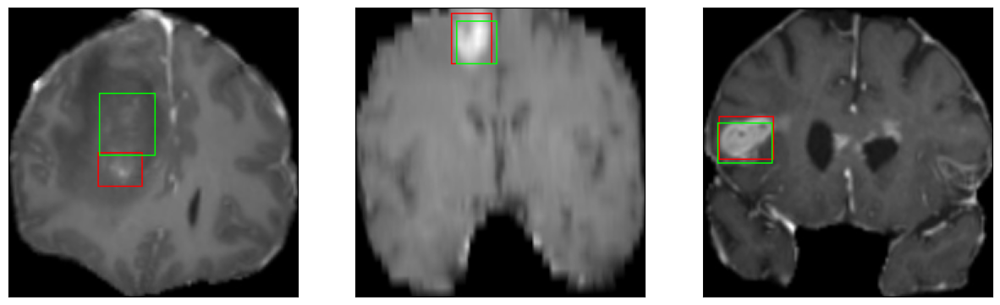

52/52 [==============================] - 20s 390ms/step - loss: 4.8258 - IoU: 0.6552 - val_loss: 7.8776 - val_IoU: 0.6442
Epoch 66/100
52/52 [==============================] - ETA: 0s - loss: 4.7596 - IoU: 0.6652
Epoch 66: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


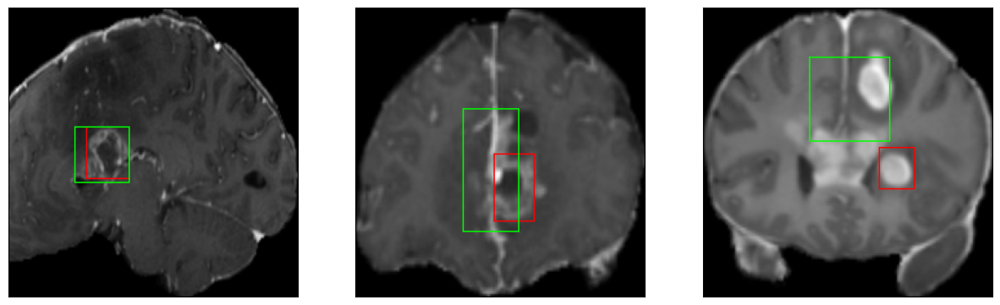

52/52 [==============================] - 20s 391ms/step - loss: 4.7596 - IoU: 0.6652 - val_loss: 6.9915 - val_IoU: 0.6381
Epoch 67/100
52/52 [==============================] - ETA: 0s - loss: 4.7566 - IoU: 0.6642
Epoch 67: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


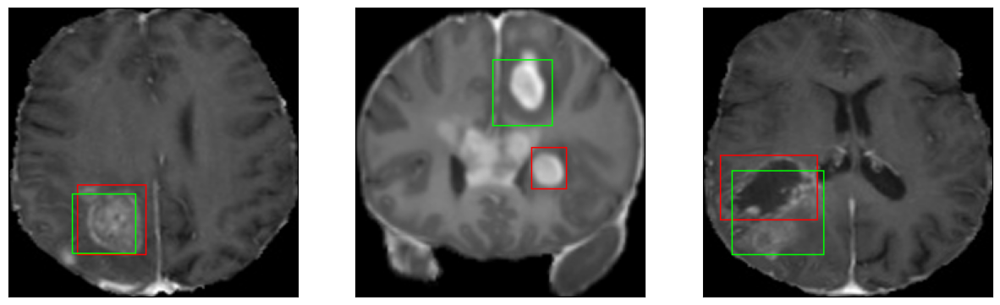

52/52 [==============================] - 20s 384ms/step - loss: 4.7566 - IoU: 0.6642 - val_loss: 7.0640 - val_IoU: 0.6601
Epoch 68/100
52/52 [==============================] - ETA: 0s - loss: 5.0052 - IoU: 0.6450
Epoch 68: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


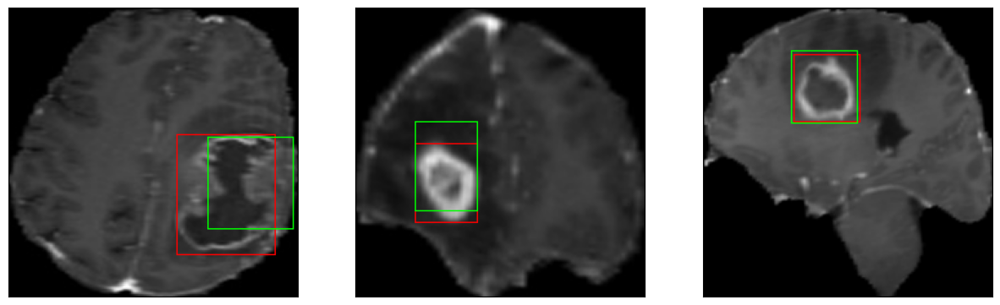

52/52 [==============================] - 20s 386ms/step - loss: 5.0052 - IoU: 0.6450 - val_loss: 8.0077 - val_IoU: 0.6104
Epoch 69/100
52/52 [==============================] - ETA: 0s - loss: 4.9291 - IoU: 0.6532
Epoch 69: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


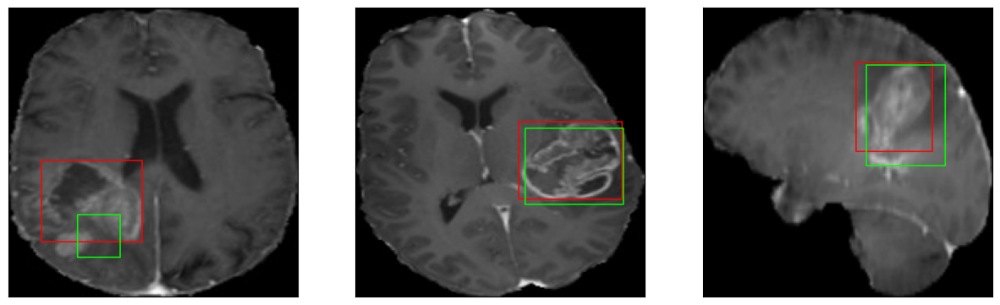

52/52 [==============================] - 21s 396ms/step - loss: 4.9291 - IoU: 0.6532 - val_loss: 7.6040 - val_IoU: 0.6205
Epoch 70/100
52/52 [==============================] - ETA: 0s - loss: 5.3073 - IoU: 0.6355
Epoch 70: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


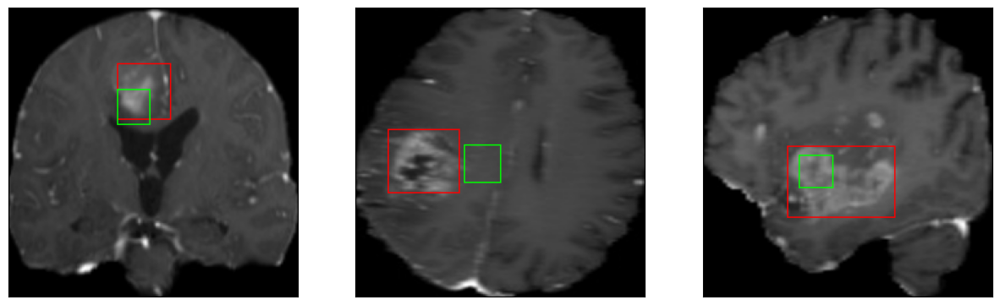

52/52 [==============================] - 20s 391ms/step - loss: 5.3073 - IoU: 0.6355 - val_loss: 12.5264 - val_IoU: 0.4809
Epoch 71/100
52/52 [==============================] - ETA: 0s - loss: 5.0452 - IoU: 0.6523
Epoch 71: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 146ms/step


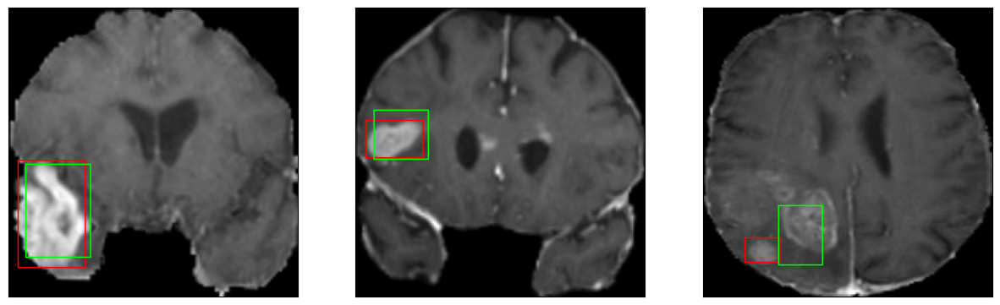

52/52 [==============================] - 20s 393ms/step - loss: 5.0452 - IoU: 0.6523 - val_loss: 7.7611 - val_IoU: 0.5934
Epoch 72/100
52/52 [==============================] - ETA: 0s - loss: 5.0887 - IoU: 0.6490
Epoch 72: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


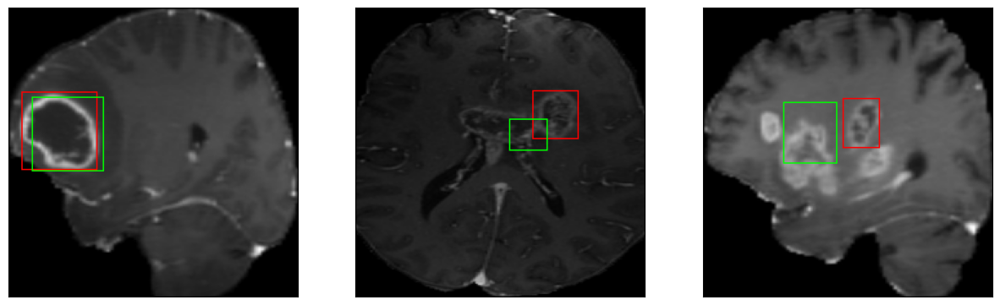

52/52 [==============================] - 20s 395ms/step - loss: 5.0887 - IoU: 0.6490 - val_loss: 8.1551 - val_IoU: 0.6074
Epoch 73/100
52/52 [==============================] - ETA: 0s - loss: 5.1969 - IoU: 0.6413
Epoch 73: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


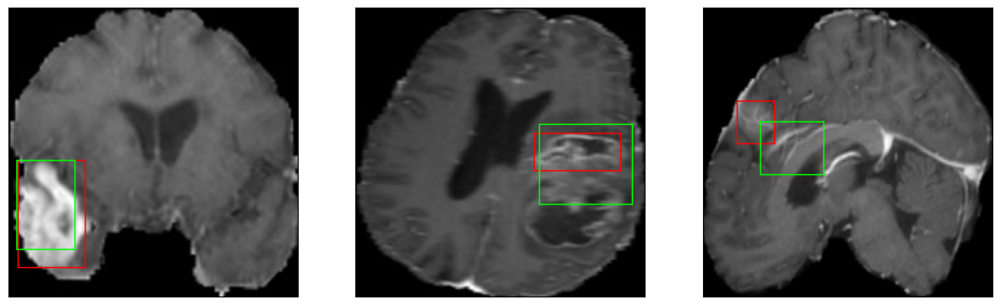

52/52 [==============================] - 20s 390ms/step - loss: 5.1969 - IoU: 0.6413 - val_loss: 9.2093 - val_IoU: 0.5751
Epoch 74/100
52/52 [==============================] - ETA: 0s - loss: 5.1623 - IoU: 0.6393
Epoch 74: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


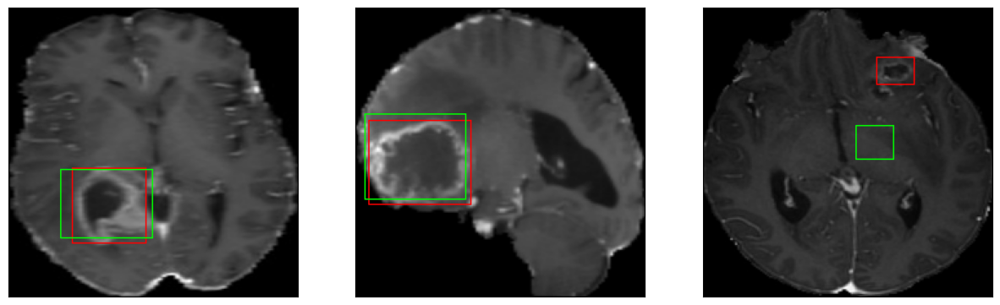

52/52 [==============================] - 20s 394ms/step - loss: 5.1623 - IoU: 0.6393 - val_loss: 7.3617 - val_IoU: 0.6319
Epoch 75/100
52/52 [==============================] - ETA: 0s - loss: 4.7861 - IoU: 0.6622
Epoch 75: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 148ms/step


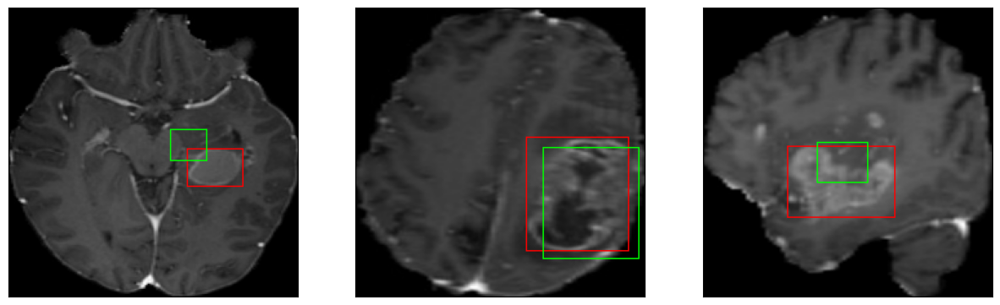

52/52 [==============================] - 20s 386ms/step - loss: 4.7861 - IoU: 0.6622 - val_loss: 7.6310 - val_IoU: 0.6350
Epoch 76/100
52/52 [==============================] - ETA: 0s - loss: 4.7424 - IoU: 0.6625
Epoch 76: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 149ms/step


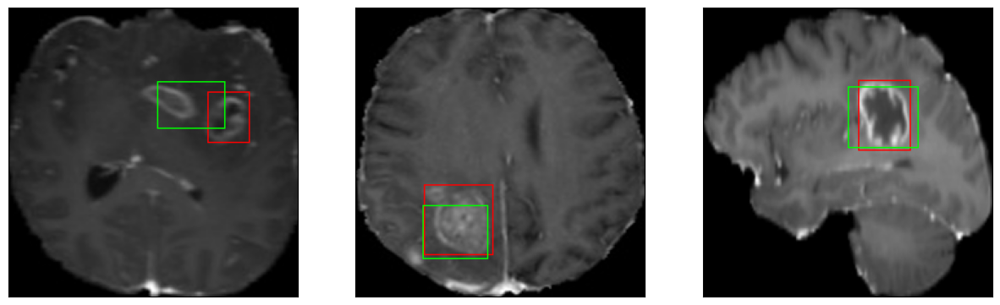

52/52 [==============================] - 20s 384ms/step - loss: 4.7424 - IoU: 0.6625 - val_loss: 7.2981 - val_IoU: 0.6616
Epoch 77/100
52/52 [==============================] - ETA: 0s - loss: 4.6608 - IoU: 0.6682
Epoch 77: val_IoU did not improve from 0.66439
8/8 [==============================] - 1s 147ms/step


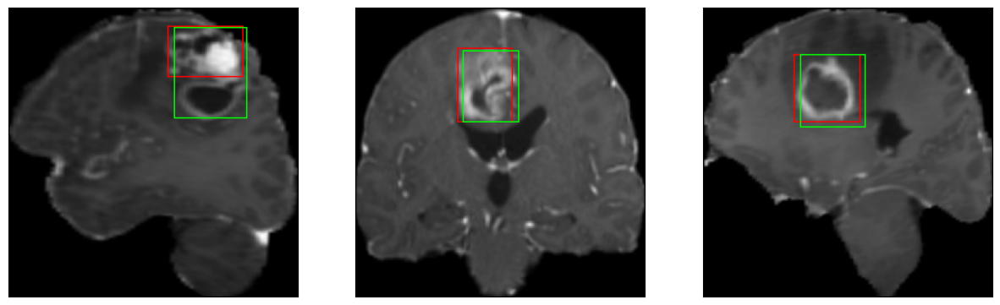

52/52 [==============================] - 20s 394ms/step - loss: 4.6608 - IoU: 0.6682 - val_loss: 7.4472 - val_IoU: 0.6375


In [29]:
hist = model.fit(
        train_dataset,
        epochs=100,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

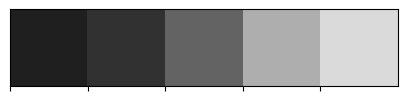

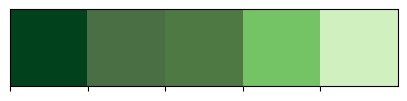

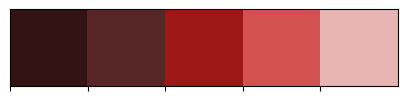

In [30]:
import seaborn as sns
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']

sns.palplot(colors_dark)
sns.palplot(colors_green)
sns.palplot(colors_red)

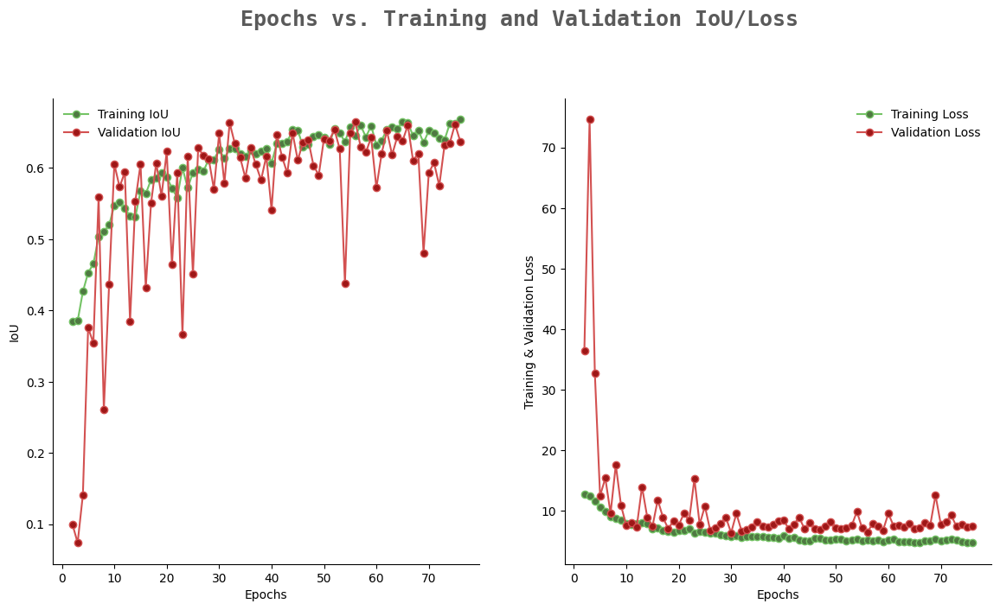

In [41]:
from warnings import filterwarnings
filterwarnings('ignore')

epochs = [i for i in range(2,77)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = hist.history['IoU']
train_loss = hist.history['loss']
val_acc = hist.history['val_IoU']
val_loss = hist.history['val_loss']

fig.text(s='Epochs vs. Training and Validation IoU/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc[2:77], marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training IoU')
ax[0].plot(epochs, val_acc[2:77], marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation IoU')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('IoU')

sns.despine()
ax[1].plot(epochs, train_loss[2:77], marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss[2:77], marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

In [32]:
model = tf.keras.models.load_model('./model_checkpoint_RESNET/model_RESNET.h5', compile=False)

In [33]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

In [35]:
model.evaluate(test_dataset)

15/15 [==============================] - 1s 91ms/step - loss: 8.4935 - IoU: 0.5867


[8.49350643157959, 0.5866671800613403]

In [37]:
model.evaluate(val_dataset)

6/6 [==============================] - 1s 90ms/step - loss: 6.4334 - IoU: 0.6747


[6.43344783782959, 0.6746821403503418]

In [38]:
model.evaluate(train_dataset)

52/52 [==============================] - 5s 95ms/step - loss: 3.9250 - IoU: 0.7353


[3.925034999847412, 0.7353330850601196]